# Explore CTs
Here I'm looking through our cell type annotations across the UMAP and in certain conditions to find some interesting effects due to the stimulation conditions.

In [1]:
import scanpy as sc
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import warnings
import itertools as it
import json
import requests
import seaborn as sns
import pickle as pkl
from functools import reduce
import diffxpy.api as de
import anndata

In [2]:
sc.settings.verbosity = 4
sc.settings.set_figure_params(dpi=80)
print(sc.__version__)
sc.settings.n_jobs=30

1.5.1


In [3]:
prefix = '/data/codec/production.run/'

### Load in Data

In [4]:
path = prefix + 'mrna/h5ads/concat.3.h5ad'

concat = sc.read_h5ad(path)

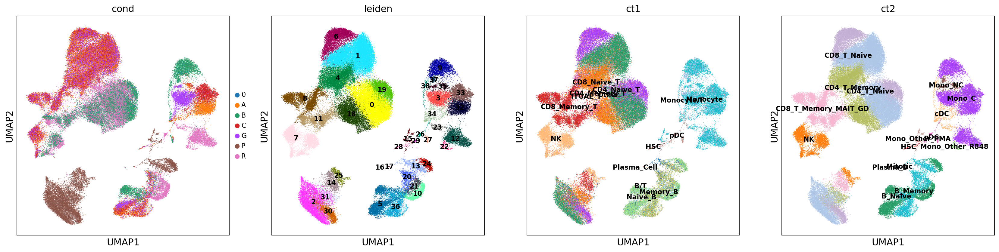

In [5]:
fig, ax = plt.subplots(1, 4, figsize=(26,6))
for color, ax, loc in tqdm(zip(['cond', 'leiden', 'ct1', 'ct2'], ax, ['right margin', 'on data', 'on data', 'on data'])):
    sc.pl.umap(concat,color=color, ax=ax, show=False, return_fig=False, size=2, legend_loc=loc, legend_fontsize=10)

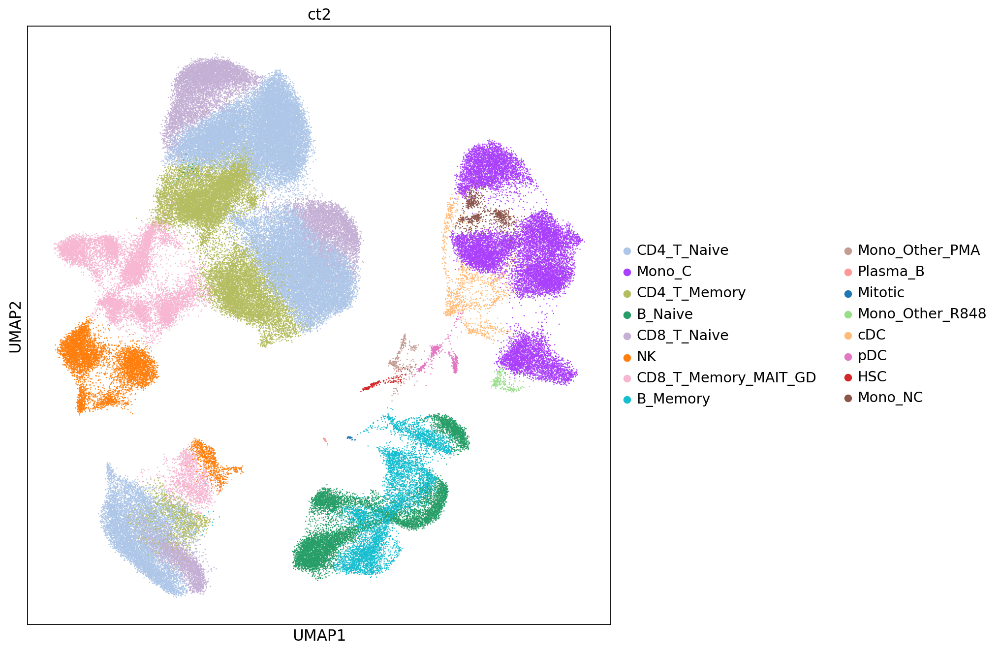

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(9.5,10))
for color, ax in zip(['ct2'], [ax]):
    sc.pl.umap(concat, color=color, ax=ax, show=False, return_fig=False, size=5)

Later on, the `ct2_colors` attribute of the adata object disappears, so I store it in a variable here because I want to color scheme to be consistent. I should figure out what causes it to disappear.

In [9]:
ct2_colors = concat.uns['ct2_colors']

Also want to make a dict with the celltype colors:

In [22]:
# import matplotlib as mpl
# ct_colors = dict()

# ct_colors['hex'] = dict(zip(concat.obs['ct2'].dtype.categories, concat.uns['ct2_colors']))
# ct_colors['rgb'] = dict(zip(ct_colors['hex'].keys(), map(mpl.colors.hex2color, ct_colors['hex'].values())))

# with open(prefix + 'ct.colors.pkl', 'wb') as file:
#     pkl.dump(ct_colors, file)

## Control Cells

In [10]:
concat_ctrl = concat[concat.obs['cond'] == 'C'].copy()

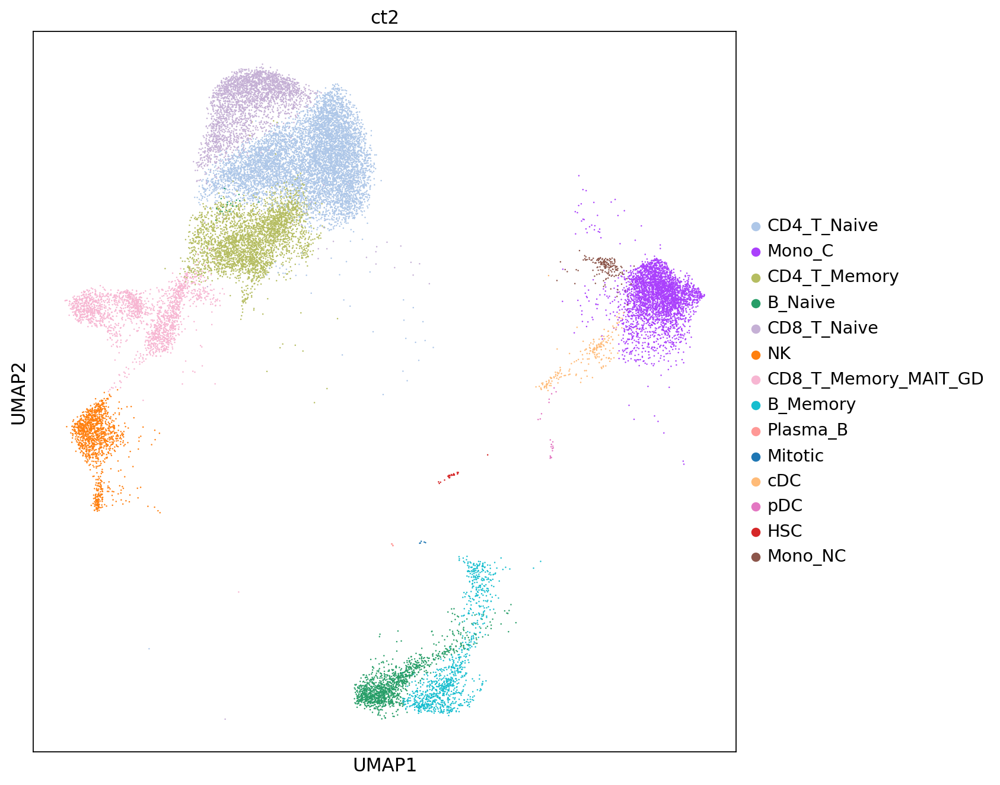

In [11]:
fig, ax = plt.subplots(1, 1, figsize=(9.5,10))
for color, ax in zip(['ct2'], [ax]):
    sc.pl.umap(concat_ctrl, color=color, ax=ax, show=False, return_fig=False, size=5)

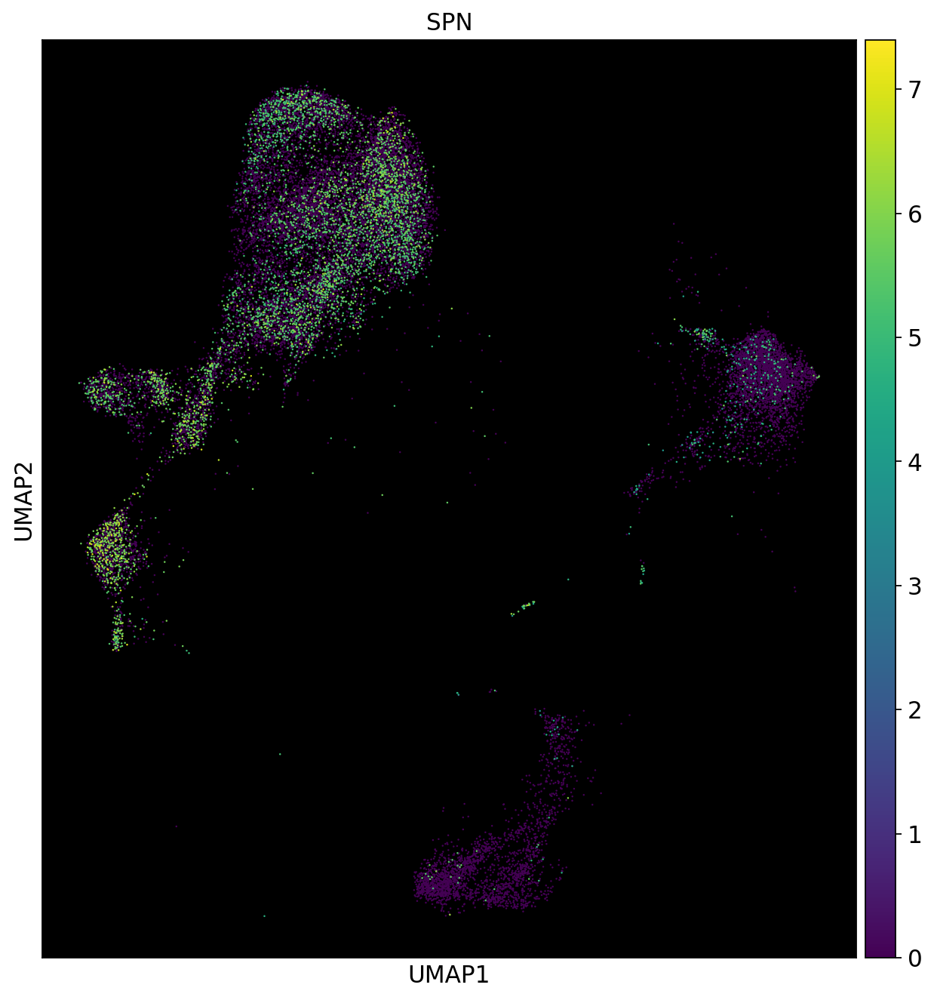

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(9.5,10))
for color, ax in zip(['SPN'], [ax]):
    ax.set_facecolor('black')
    sc.pl.umap(concat_ctrl, color=color, ax=ax, show=False, return_fig=False, size=5)

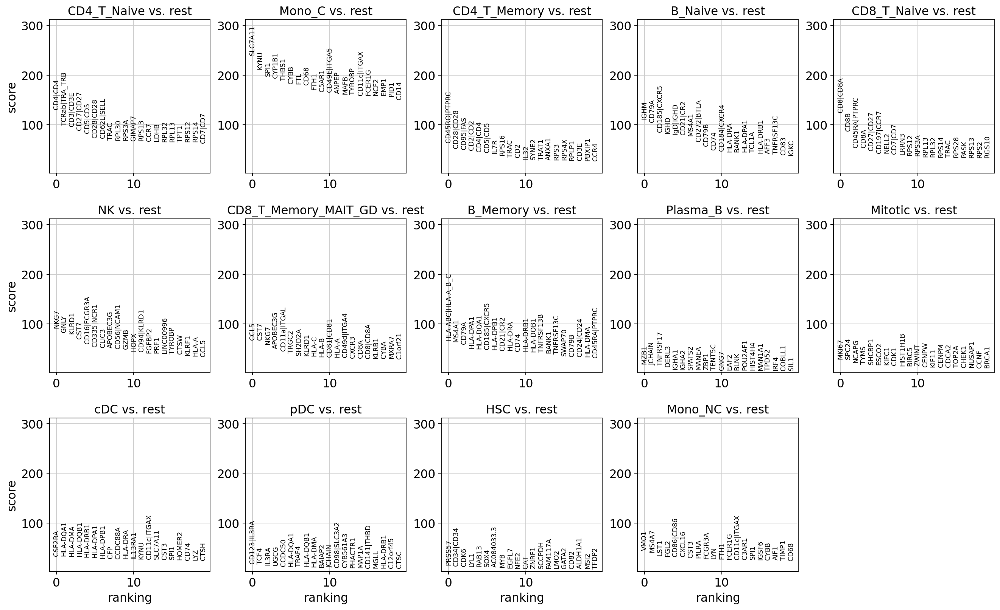

In [13]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(concat_ctrl, groupby='ct2', n_genes=200)
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(concat_ctrl, ncols=5, n_genes=20)
sc.settings.verbosity = 4

In [14]:
diff_features = np.array(concat_ctrl.uns['rank_genes_groups']['names'].tolist()).T

In [15]:
protein = np.core.defchararray.find(diff_features,'|') != -1
ribo1 = np.core.defchararray.find(diff_features,'RPS') != -1
ribo2 = np.core.defchararray.find(diff_features,'RPL') != -1

In [16]:
stack_drop = np.stack([protein, ribo1, ribo2])

In [17]:
drop_features = np.any(stack_drop,axis=0)

In [18]:
transcripts_to_plot = list()
for mybool, features in zip(drop_features, diff_features):
    transcripts_to_plot.append(features[~mybool].tolist()[:3])

In [19]:
transcripts_to_plot = np.array([i for j in transcripts_to_plot for i in j])

In [20]:
inds = np.unique(transcripts_to_plot, return_index=True)[1]
transcripts_to_plot = [transcripts_to_plot[inds] for inds in sorted(inds)]

    using 'X_pca' with n_pcs = 200
Storing dendrogram info using `.uns['dendrogram_ct2']`


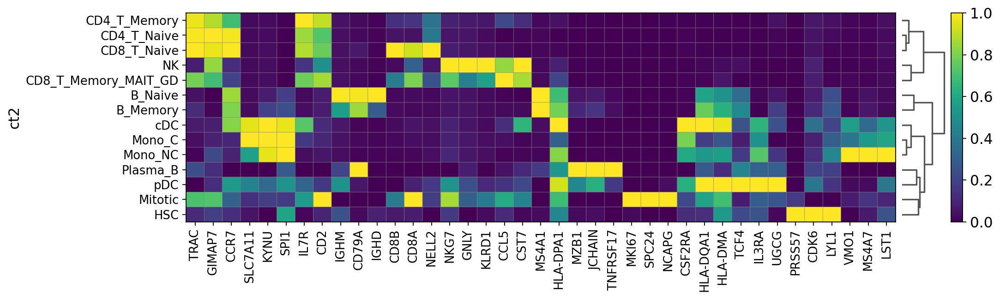

In [21]:
sc.pl.matrixplot(concat_ctrl, var_names=transcripts_to_plot, 
                 groupby='ct2', dendrogram=True, standard_scale='var');

In [22]:
proteins_to_plot = list()
for mybool, features in zip(protein, diff_features):
    proteins_to_plot.append(features[mybool].tolist()[:3])

In [23]:
proteins_to_plot = np.array([i for j in proteins_to_plot for i in j])

In [24]:
inds = np.unique(proteins_to_plot, return_index=True)[1]
proteins_to_plot = [proteins_to_plot[inds] for inds in sorted(inds)]

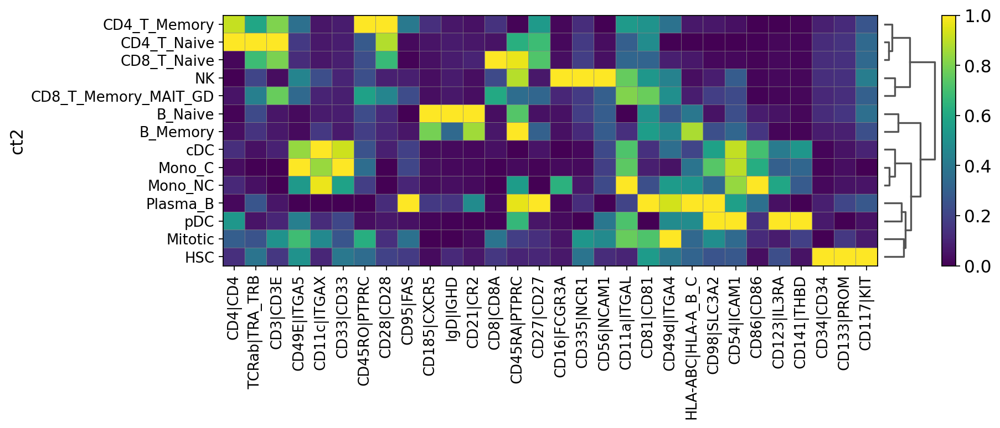

In [25]:
sc.pl.matrixplot(concat_ctrl, var_names=proteins_to_plot, 
                 groupby='ct2', dendrogram=True, standard_scale='var');

In [26]:
s_counts = concat_ctrl.obs['ct2'].value_counts()

In [27]:
carry_over_colors = concat_ctrl.uns['ct2_colors'][(s_counts > 500).values]

In [28]:
concat_ctrl_high_count = concat_ctrl[concat_ctrl.obs['ct2'].isin(s_counts[s_counts > 500].index.tolist())].copy()

In [29]:
concat_ctrl_high_count.uns['ct2_colors'] = carry_over_colors

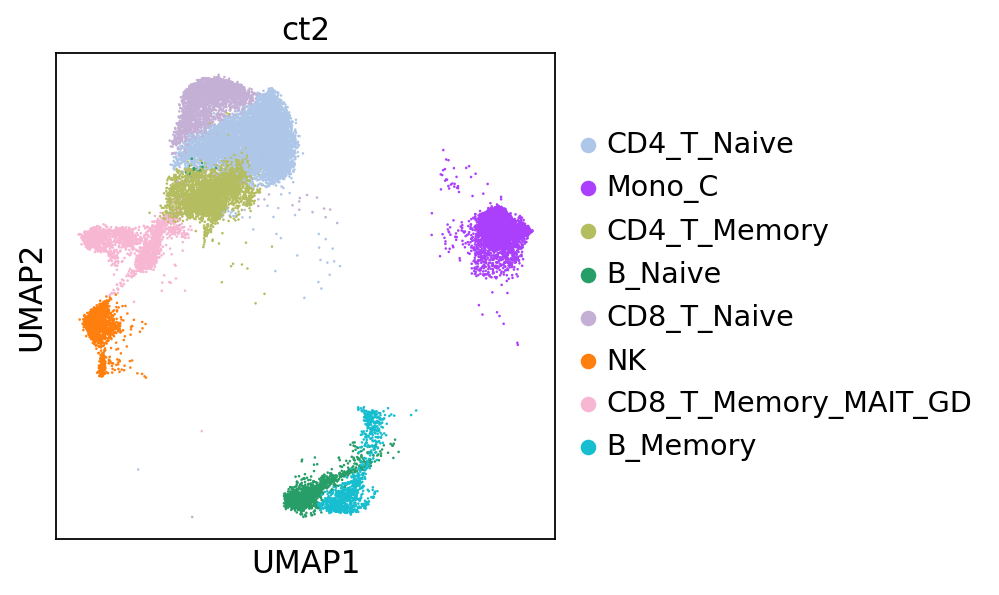

In [30]:
sc.pl.umap(concat_ctrl_high_count, color='ct2')

/home/ssm-user/anaconda3/envs/codec/lib/python3.6/site-packages/scanpy/plotting/_anndata.py:3386: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  np.matrix([label2code[lab] for lab in obs_tidy.index]).T,


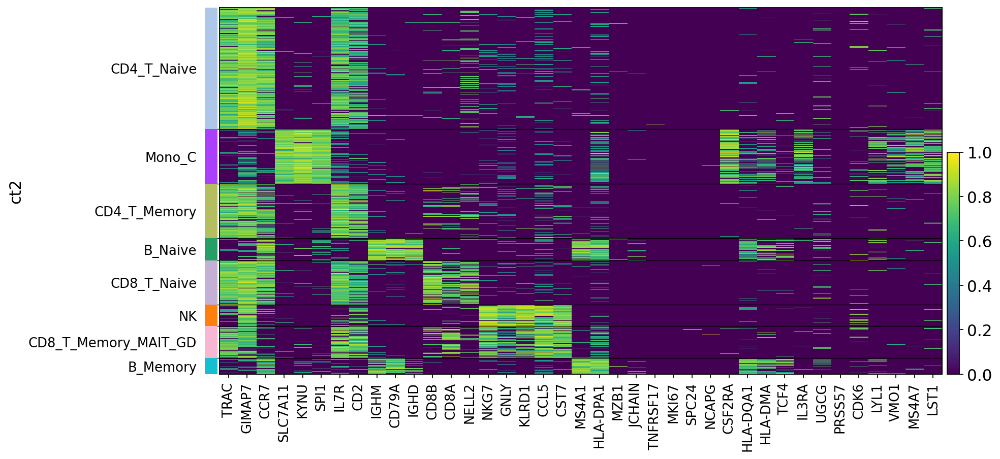

In [31]:
sc.pl.heatmap(concat_ctrl_high_count, var_names=transcripts_to_plot, 
              groupby='ct2', standard_scale='var', use_raw=True
             );

In [32]:
diff_features = np.array(concat_ctrl.uns['rank_genes_groups']['names'].tolist()).T

In [33]:
protein = np.core.defchararray.find(diff_features,'|') != -1

In [34]:
drop_features = ~protein

In [35]:
features_to_plot = list()
for mybool, features in zip(drop_features, diff_features):
    features_to_plot.append(features[~mybool].tolist()[:4])

In [36]:
features_to_plot = np.array([i for j in features_to_plot for i in j])

In [37]:
inds = np.unique(features_to_plot, return_index=True)[1]
features_to_plot = [features_to_plot[inds] for inds in sorted(inds)]

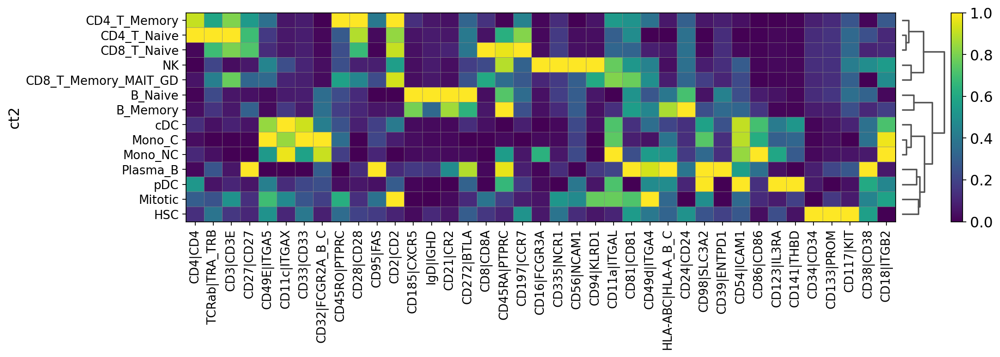

In [38]:
sc.pl.matrixplot(concat_ctrl, var_names=features_to_plot, 
                 groupby='ct2', dendrogram=True, standard_scale='var');

In [39]:
len(features_to_plot)

39

In [40]:
s_counts = concat_ctrl.obs['ct2'].value_counts()

/home/ssm-user/anaconda3/envs/codec/lib/python3.6/site-packages/scanpy/plotting/_anndata.py:3409: PendingDeprecationWarning: the matrix subclass is not the recommended way to represent matrices or deal with linear algebra (see https://docs.scipy.org/doc/numpy/user/numpy-for-matlab-users.html). Please adjust your code to use regular ndarray.
  np.matrix([label2code[lab] for lab in obs_tidy.index]),


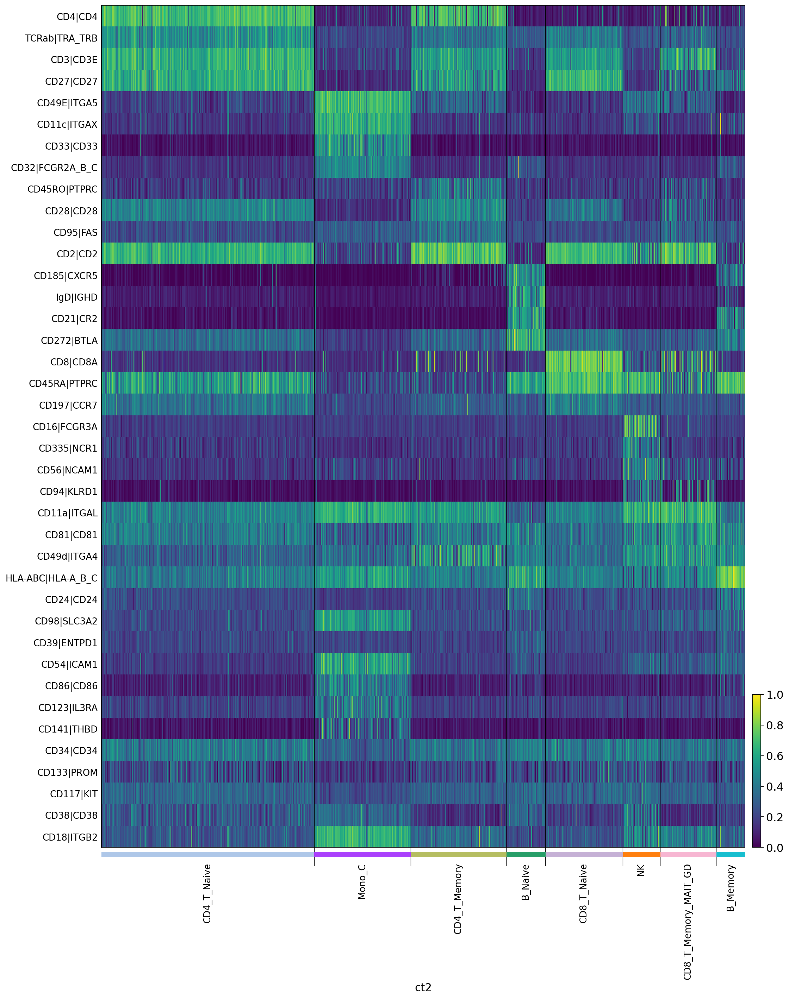

In [41]:
gs = sc.pl.heatmap(concat_ctrl_high_count, var_names=features_to_plot, 
                   groupby='ct2', standard_scale='var', 
                   use_raw=True, swap_axes=True, figsize=(15, 20));

In [42]:
def get_raw_adts(obs_names):
    path = prefix + 'adts/pkls/concat.adts.pkl'
    
    with open(path,'rb') as file:
        return pkl.load(file)[obs_names, :]

def get_raw_mrna(obs_names):
    path = prefix + 'mrna/pkls/aggr/wells.sng.w_covars.pkl'
    
    with open(path,'rb') as file:
        wells = pkl.load(file)
    
    for well in wells:
        wells[well]['adata'].obs_names = [i[:16] + '-%s' % well for i in wells[well]['adata'].obs_names]
    
    return wells[0]['adata'].concatenate(*[wells[i]['adata'] for  i in range(1, 12)])[obs_names,:]
    
def clr_normalize_column(x):
    normed_column = np.log1p((x) / (np.exp(sum(np.log1p((x)[x > 0 ])) / len(x + 1))))
    return normed_column

def clr_normalize(x):
    normed_matrix = np.apply_along_axis(clr_normalize_column, 1, x)
    return normed_matrix
    
def get_raw(adata, transformed=True):
    raw_mrna = get_raw_mrna(adata.obs_names)
    raw_adts = get_raw_adts(adata.obs_names)
    
    adata.obs['adts_n_counts'] = raw_adts.X.toarray().sum(axis=1)
    
    if transformed == True:
        sc.pp.normalize_per_cell(raw_mrna,counts_per_cell_after=1e6)
        sc.pp.log1p(raw_mrna)
        
        sc.pp.normalize_per_cell(raw_adts, counts_per_cell_after=1e6);
        raw_adts.X = clr_normalize(raw_adts.X.toarray())
    
    return raw_mrna, raw_adts

In [43]:
raw_mrna, raw_adts = get_raw(concat, transformed=False)

In [44]:
raw_mrna.obs['ct2'] = concat.obs['ct2']
raw_adts.obs['ct2'] = concat.obs['ct2']

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [45]:
concat.obs['ct2'].value_counts()

CD4_T_Naive             48289
CD4_T_Memory            18925
Mono_C                  16726
CD8_T_Naive             14904
CD8_T_Memory_MAIT_GD    11517
B_Naive                  8744
NK                       7248
B_Memory                 6492
cDC                      1231
Mono_NC                   832
pDC                       476
Mono_Other_PMA            299
Mono_Other_R848           221
HSC                       176
Plasma_B                   36
Mitotic                    26
Name: ct2, dtype: int64

In [46]:
conds = concat.obs['cond'].dtype.categories
clusts = concat.obs['ct2'].dtype.categories

In [47]:
cond_ct_df = pd.DataFrame(index=conds, columns=clusts, dtype=np.int)

In [48]:
for cond in tqdm(conds):
    for clust in clusts:
        cond_ct_df.loc[cond, clust] = concat[(concat.obs['cond'] == cond) & (concat.obs['ct2'] == clust)].shape[0]

After the last cell, ct2_colors disappears (haven't bothered to figure out why) but I'm just going to set it manually here.

In [49]:
concat.uns['ct2_colors'] = ct2_colors

In [50]:
cond_ct_df_div = cond_ct_df.divide(cond_ct_df.sum(0),1)

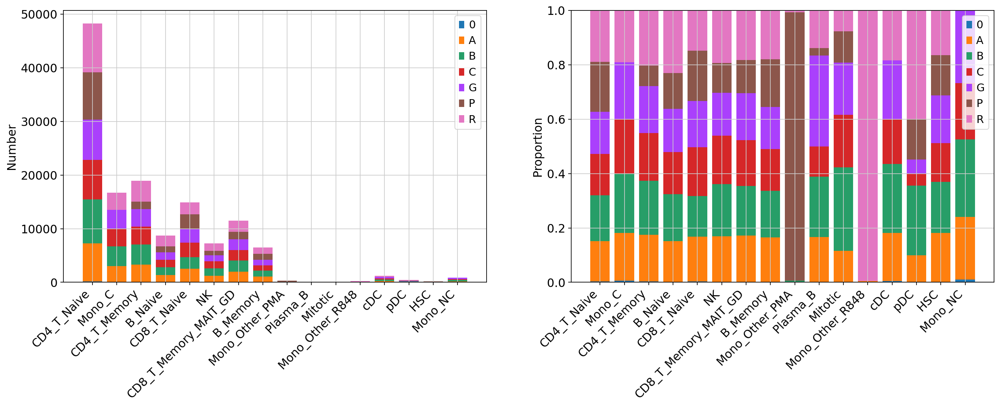

In [51]:
fig, ax = plt.subplots(1,2,figsize=(20,6))
for ax, df, ylabel in zip(ax, [cond_ct_df, cond_ct_df_div], ['Number','Proportion']):
    labels = clusts
    props = dict()

    for cond in conds:
        props[cond] = df.loc[cond].values
    lastpos = [0]*len(clusts)
    for cond in props:
        ax.bar(labels, props[cond], label=cond, bottom=lastpos)
        lastpos = props[cond] + lastpos

    ax.set_ylabel(ylabel)
    ax.set_xticklabels(labels, rotation=45, horizontalalignment='right')
    ax.legend()

In [52]:
high_count_cts = concat.obs['ct2'].value_counts()[:-2].index.tolist()
print(high_count_cts)

['CD4_T_Naive', 'CD4_T_Memory', 'Mono_C', 'CD8_T_Naive', 'CD8_T_Memory_MAIT_GD', 'B_Naive', 'NK', 'B_Memory', 'cDC', 'Mono_NC', 'pDC', 'Mono_Other_PMA', 'Mono_Other_R848', 'HSC']


In [53]:
free_ids = np.unique(concat.obs['free_id'].values)
ind_ct = pd.DataFrame(0, index=free_ids, columns=high_count_cts)

In [54]:
for free_id, ct in tqdm(it.product(free_ids, high_count_cts)):
    ind_ct.loc[free_id, ct] = len(concat.obs[(concat.obs['free_id'] == free_id) & (concat.obs['ct2'] == ct)])

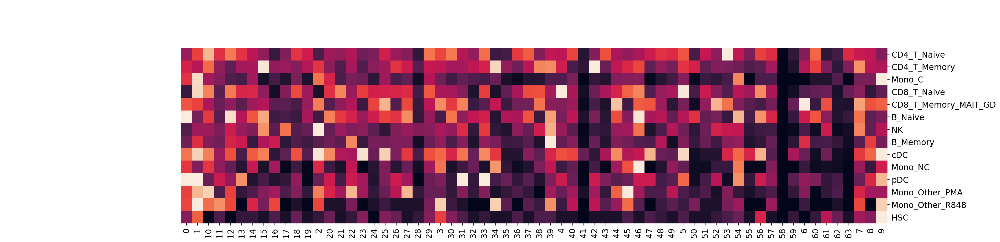

In [55]:
sns.clustermap(data=ind_ct.T, row_cluster=False, col_cluster=False, standard_scale=0, figsize=(24,6), cbar_pos=None);

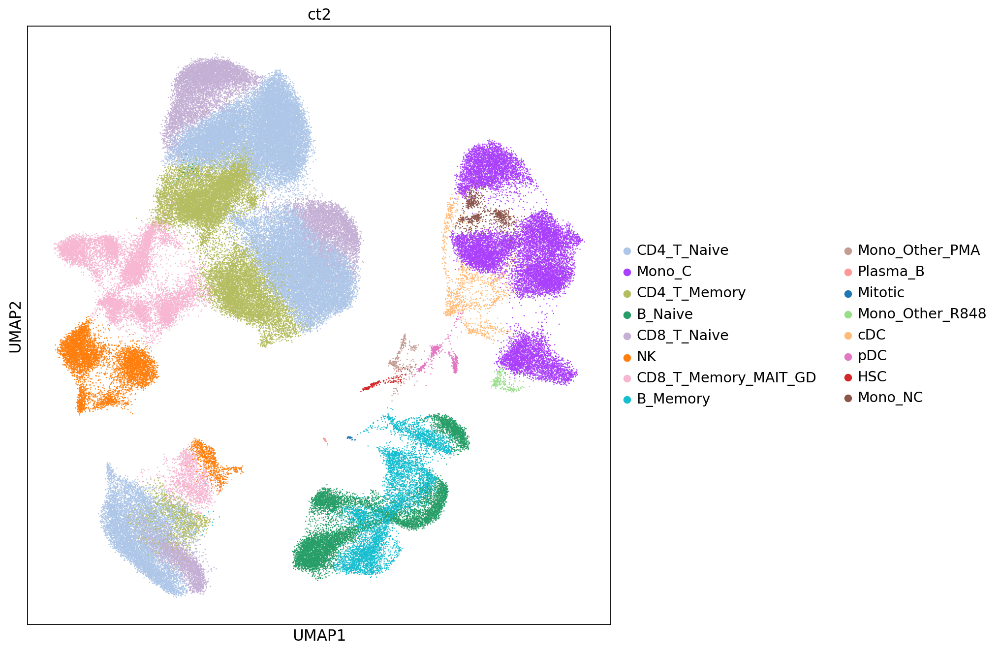

In [56]:
fig, ax = plt.subplots(1, 1, figsize=(9.5,10))
for color, ax in zip(['ct2'], [ax]):
    sc.pl.umap(concat, color=color, ax=ax, show=False, return_fig=False, size=5)

In [57]:
color_dict = dict(zip(concat.obs['ct2'].dtype.categories, ct2_colors))

In [58]:
color_dict

{'CD4_T_Naive': '#aec7e8',
 'Mono_C': '#aa40fc',
 'CD4_T_Memory': '#b5bd61',
 'B_Naive': '#279e68',
 'CD8_T_Naive': '#c5b0d5',
 'NK': '#ff7f0e',
 'CD8_T_Memory_MAIT_GD': '#f7b6d2',
 'B_Memory': '#17becf',
 'Mono_Other_PMA': '#c49c94',
 'Plasma_B': '#ff9896',
 'Mitotic': '#1f77b4',
 'Mono_Other_R848': '#98df8a',
 'cDC': '#ffbb78',
 'pDC': '#e377c2',
 'HSC': '#d62728',
 'Mono_NC': '#8c564b'}

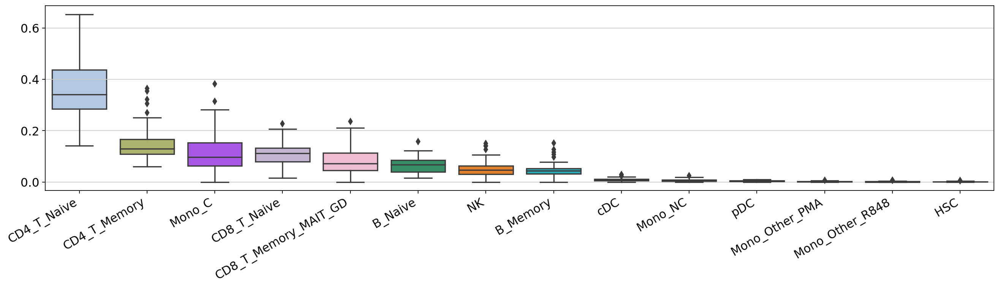

In [59]:
fig, ax = plt.subplots(1, 1, figsize=(20,4))
sns.boxplot(data=ind_ct.divide(ind_ct.sum(1),0), ax=ax, palette=color_dict)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, horizontalalignment='right');

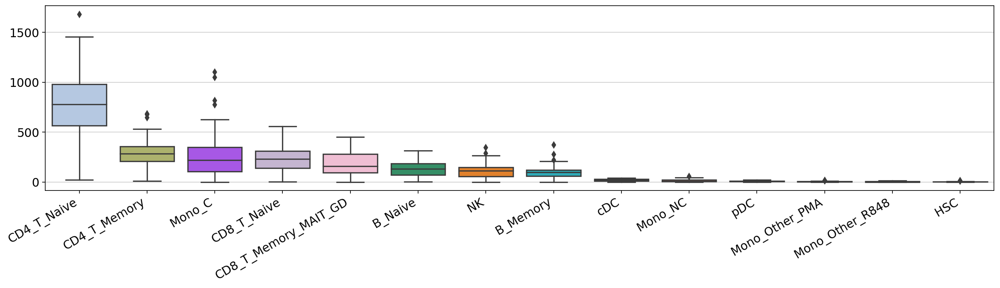

In [60]:
fig, ax = plt.subplots(1, 1, figsize=(20,4))
sns.boxplot(data=ind_ct, ax=ax, palette=color_dict)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, horizontalalignment='right');

In [61]:
ind_ct_scaled = ind_ct - ind_ct.mean()

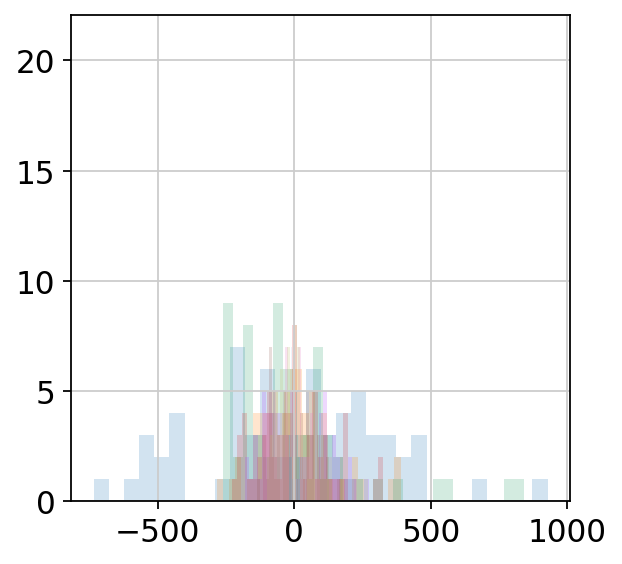

In [62]:
for ct in high_count_cts:
    plt.hist(ind_ct_scaled[ct].values, bins=30, alpha=0.2);

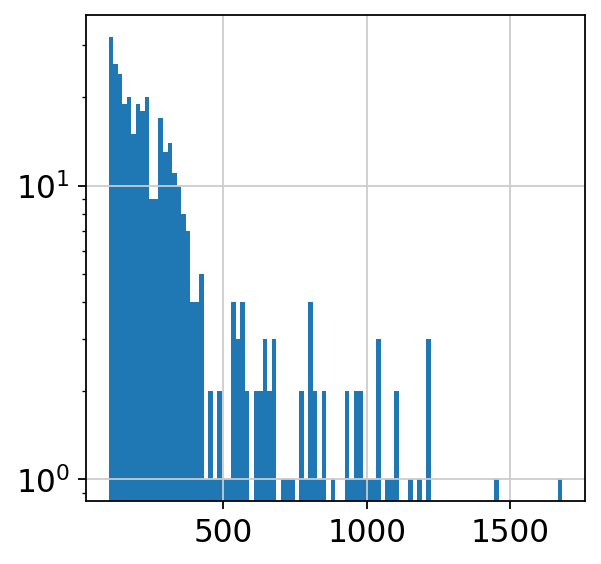

In [63]:
plt.hist(np.ravel(ind_ct.values)[np.ravel(ind_ct.values) > 100], bins=100)
plt.yscale('log');

In [64]:
thresh_df = pd.DataFrame(index=ind_ct.columns)

In [65]:
def decimal_ticks(gens):
    ticks = list()
    for gen in range(gens):
        ticks += list(range(10**gen,10**(gen+1),10**gen))
    return ticks

In [66]:
thresholds = decimal_ticks(4)[:-7] # up to 2000, which I figured out was the first threshold with 0 counts across all cts

In [67]:
for thresh in [0.5] + thresholds: # add 0.5 or else it doesn't plot the zero, which I think is important
    thresh_df = thresh_df.join(pd.Series((ind_ct > thresh).sum(),name=thresh))

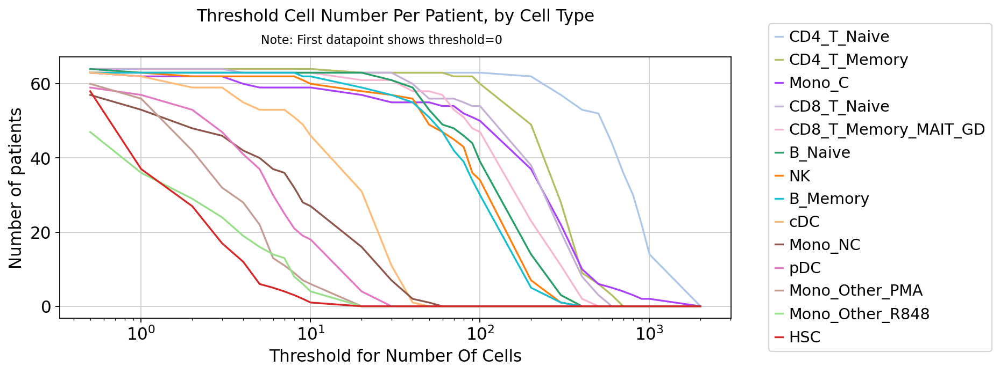

In [68]:
plt.figure(figsize=(10,4))
for ct in thresh_df.index:
    plt.plot(thresh_df.columns,thresh_df.loc[ct].values, c=color_dict[ct], label=ct)
plt.legend(bbox_to_anchor=(1.4, 0.5), loc='center right')
plt.xscale('log');
plt.xlabel('Threshold for Number Of Cells')
plt.ylabel('Number of patients')
plt.title('Threshold Cell Number Per Patient, by Cell Type', pad=30);
ax = plt.gca()
plt.figtext(s='Note: First datapoint shows threshold=0', x=0.3, y=1.05, size=10, transform=ax.transAxes);

In [69]:
ct_cond_id = list(it.product(high_count_cts, ['A', 'B', 'C', 'G', 'P', 'R'], free_ids))

In [70]:
ct_cond_id_df = pd.DataFrame(ct_cond_id, columns=['CT','COND', 'FID'])

In [71]:
ct_cond_id_df

,CT,COND,FID
0,CD4_T_Naive,A,0
1,CD4_T_Naive,A,1
2,CD4_T_Naive,A,10
3,CD4_T_Naive,A,11
4,CD4_T_Naive,A,12
...,...,...,...
5371,HSC,R,62
5372,HSC,R,63
5373,HSC,R,7
5374,HSC,R,8


In [72]:
counts_genes = list()
cell_counts = list()
for ct, cond, free_id in tqdm(ct_cond_id):
    arr = raw_mrna[(raw_mrna.obs['ct2'] == ct) & (raw_mrna.obs['cond'] == cond) & (raw_mrna.obs['free_id'] == free_id)].X.toarray()
    cell_counts.append(len(arr))
    counts_genes.append(arr.sum(axis=0))

In [73]:
ct_cond_id_df = ct_cond_id_df.join(pd.DataFrame(data=np.array(cell_counts),columns=['NUM_CELLS']))
ct_cond_id_df = ct_cond_id_df.join(pd.DataFrame(data=np.array(counts_genes),columns=raw_mrna.var_names))

In [74]:
lot = list()
for i in ct_cond_id_df[['CT','COND']].itertuples(index=False):
    lot.append('-'.join(tuple(i)))

In [75]:
np.unique(lot, return_counts=True)

(array(['B_Memory-A', 'B_Memory-B', 'B_Memory-C', 'B_Memory-G',
        'B_Memory-P', 'B_Memory-R', 'B_Naive-A', 'B_Naive-B', 'B_Naive-C',
        'B_Naive-G', 'B_Naive-P', 'B_Naive-R', 'CD4_T_Memory-A',
        'CD4_T_Memory-B', 'CD4_T_Memory-C', 'CD4_T_Memory-G',
        'CD4_T_Memory-P', 'CD4_T_Memory-R', 'CD4_T_Naive-A',
        'CD4_T_Naive-B', 'CD4_T_Naive-C', 'CD4_T_Naive-G', 'CD4_T_Naive-P',
        'CD4_T_Naive-R', 'CD8_T_Memory_MAIT_GD-A',
        'CD8_T_Memory_MAIT_GD-B', 'CD8_T_Memory_MAIT_GD-C',
        'CD8_T_Memory_MAIT_GD-G', 'CD8_T_Memory_MAIT_GD-P',
        'CD8_T_Memory_MAIT_GD-R', 'CD8_T_Naive-A', 'CD8_T_Naive-B',
        'CD8_T_Naive-C', 'CD8_T_Naive-G', 'CD8_T_Naive-P', 'CD8_T_Naive-R',
        'HSC-A', 'HSC-B', 'HSC-C', 'HSC-G', 'HSC-P', 'HSC-R', 'Mono_C-A',
        'Mono_C-B', 'Mono_C-C', 'Mono_C-G', 'Mono_C-P', 'Mono_C-R',
        'Mono_NC-A', 'Mono_NC-B', 'Mono_NC-C', 'Mono_NC-G', 'Mono_NC-P',
        'Mono_NC-R', 'Mono_Other_PMA-A', 'Mono_Other_PMA-B',
      

Okay, because I want to make it as easy as possible of DESeq2 to perform the differential expression analysis, I'm going to change some names here to make them match. As discussed with Jimmie, we _really_ think that those `Mono_Other_R848` cells are really just the NC Monocytes, though I was reluctant to call them that becuase of their lack of expression of lineage markers. However, I'm going to change the name here just to make DESeq2 think they're the same.

In [76]:
ct_cond_id_df = ct_cond_id_df[~((ct_cond_id_df['CT'] == 'Mono_Other_R848') & (ct_cond_id_df['COND'].isin(['A','B','C','G','P'])))]
ct_cond_id_df = ct_cond_id_df[~((ct_cond_id_df['CT'] == 'Mono_Other_PMA') & (ct_cond_id_df['COND'].isin(['A','B','C','G','R'])))]

In [77]:
ct_cond_id_df = ct_cond_id_df[~((ct_cond_id_df['CT'] == 'Mono_C') & (ct_cond_id_df['COND'] == 'P'))]
ct_cond_id_df = ct_cond_id_df[~((ct_cond_id_df['CT'] == 'Mono_NC') & (ct_cond_id_df['COND'] == 'P'))]
ct_cond_id_df = ct_cond_id_df[~((ct_cond_id_df['CT'] == 'cDC') & (ct_cond_id_df['COND'] == 'P'))]
ct_cond_id_df = ct_cond_id_df[~((ct_cond_id_df['CT'] == 'Mono_NC') & (ct_cond_id_df['COND'] == 'R'))]

In [78]:
ct_cond_id_df['CT'] = ct_cond_id_df['CT'].str.replace('Mono_Other_PMA','Mono_cDC_All')
ct_cond_id_df['CT'] = ct_cond_id_df['CT'].str.replace('Mono_Other_R848','Mono_NC')

In [79]:
ct_cond_id_mono_cdc = list(it.product(['Mono_cDC_All'], ['A', 'B', 'C', 'G', 'R'], free_ids))

In [80]:
counts_genes_mono_cdc = list()
cell_counts_mono_cdc = list()
for ct, cond, free_id in tqdm(ct_cond_id_mono_cdc):
    arr = raw_mrna[((raw_mrna.obs['ct2'] == 'Mono_NC') | 
                    (raw_mrna.obs['ct2'] == 'Mono_C') |
                    (raw_mrna.obs['ct2'] == 'cDC')
                   ) & 
                   (raw_mrna.obs['cond'] == cond) &
                   (raw_mrna.obs['free_id'] == free_id)].X.toarray()
    cell_counts_mono_cdc.append(len(arr))
    counts_genes_mono_cdc.append(arr.sum(axis=0))

In [81]:
ct_cond_id_mono_cdc_df = pd.DataFrame(ct_cond_id_mono_cdc, columns=['CT','COND', 'FID'])

In [82]:
ct_cond_id_mono_cdc_df = ct_cond_id_mono_cdc_df.join(pd.DataFrame(data=np.array(cell_counts_mono_cdc),columns=['NUM_CELLS']))
ct_cond_id_mono_cdc_df = ct_cond_id_mono_cdc_df.join(pd.DataFrame(data=np.array(counts_genes_mono_cdc),columns=raw_mrna.var_names))

In [83]:
ct_df = pd.concat([ct_cond_id_df, ct_cond_id_mono_cdc_df])

In [84]:
lot = list()
for i in ct_df[['CT','COND']].itertuples(index=False):
    lot.append('-'.join(tuple(i)))

In [85]:
np.unique(lot, return_counts=True)

(array(['B_Memory-A', 'B_Memory-B', 'B_Memory-C', 'B_Memory-G',
        'B_Memory-P', 'B_Memory-R', 'B_Naive-A', 'B_Naive-B', 'B_Naive-C',
        'B_Naive-G', 'B_Naive-P', 'B_Naive-R', 'CD4_T_Memory-A',
        'CD4_T_Memory-B', 'CD4_T_Memory-C', 'CD4_T_Memory-G',
        'CD4_T_Memory-P', 'CD4_T_Memory-R', 'CD4_T_Naive-A',
        'CD4_T_Naive-B', 'CD4_T_Naive-C', 'CD4_T_Naive-G', 'CD4_T_Naive-P',
        'CD4_T_Naive-R', 'CD8_T_Memory_MAIT_GD-A',
        'CD8_T_Memory_MAIT_GD-B', 'CD8_T_Memory_MAIT_GD-C',
        'CD8_T_Memory_MAIT_GD-G', 'CD8_T_Memory_MAIT_GD-P',
        'CD8_T_Memory_MAIT_GD-R', 'CD8_T_Naive-A', 'CD8_T_Naive-B',
        'CD8_T_Naive-C', 'CD8_T_Naive-G', 'CD8_T_Naive-P', 'CD8_T_Naive-R',
        'HSC-A', 'HSC-B', 'HSC-C', 'HSC-G', 'HSC-P', 'HSC-R', 'Mono_C-A',
        'Mono_C-B', 'Mono_C-C', 'Mono_C-G', 'Mono_C-R', 'Mono_NC-A',
        'Mono_NC-B', 'Mono_NC-C', 'Mono_NC-G', 'Mono_NC-R',
        'Mono_cDC_All-A', 'Mono_cDC_All-B', 'Mono_cDC_All-C',
        'Mono_cDC

In [86]:
ct_df.isna().sum().sum()

0

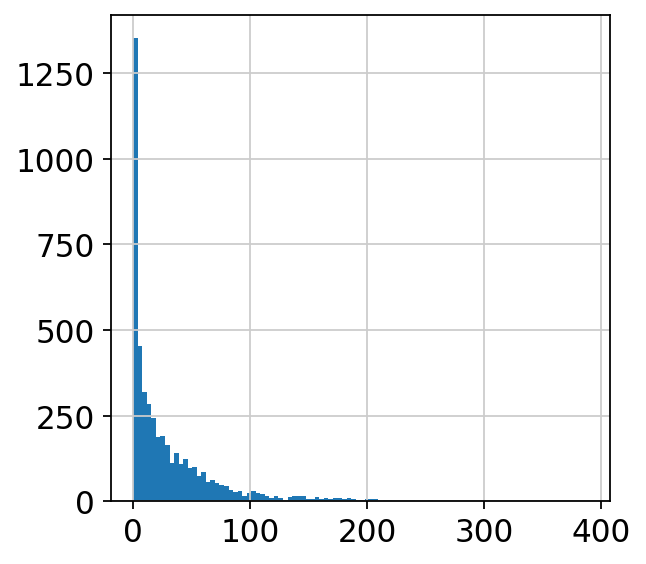

In [87]:
plt.hist(ct_df['NUM_CELLS'].values,bins=100);

In [88]:
ct_df.drop(columns=['NUM_CELLS'],inplace=True)

In [89]:
# AVOID RE-RUNNING THIS AGAIN
# ct_df.to_pickle(prefix + 'mrna/pkls/aggr/pseudobulk.cts.pkl')

# Figures

In [102]:
fig_prefix = '/data/codec/figs/'

In [152]:
concat_ctrl.uns['ct2_colors'] = ct2_colors

In [175]:
filename = fig_prefix + 'hiq.umaps/umap.control.cts.png'
fig, ax = plt.subplots(1, 1, figsize=(10,8))
sc.pl.umap(concat_ctrl, color='ct2', ax=ax, return_fig=False, 
           show=False, title="Control Cells by Cell Type/State", size=8)
plt.tight_layout()
plt.savefig(filename, dpi=80)
plt.close()

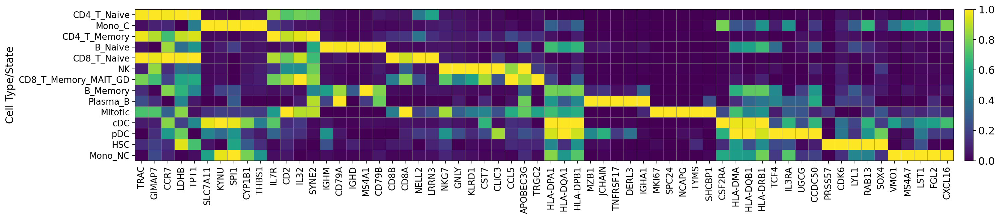

In [194]:
figdir = fig_prefix + 'misc/'
sc.settings.figdir = figdir
sc.pl.matrixplot(concat_ctrl, var_names=transcripts_to_plot, 
                 groupby='Cell Type/State', dendrogram=False, standard_scale='var', save='.ctrl.cts.diffex.genes.png');

In [98]:
concat_ctrl.obs['Cell Type/State'] = concat_ctrl.obs['ct2']
concat_ctrl.uns['Cell Type/State_colors'] = ct2_colors

In [99]:
diff_features = np.array(concat_ctrl.uns['rank_genes_groups']['names'].tolist()).T
protein = np.core.defchararray.find(diff_features,'|') != -1
drop_features = ~protein
features_to_plot = list()
for mybool, features in zip(drop_features, diff_features):
    features_to_plot.append(features[~mybool].tolist()[:4])
features_to_plot = np.array([i for j in features_to_plot for i in j])
inds = np.unique(features_to_plot, return_index=True)[1]
features_to_plot = [features_to_plot[inds] for inds in sorted(inds)]

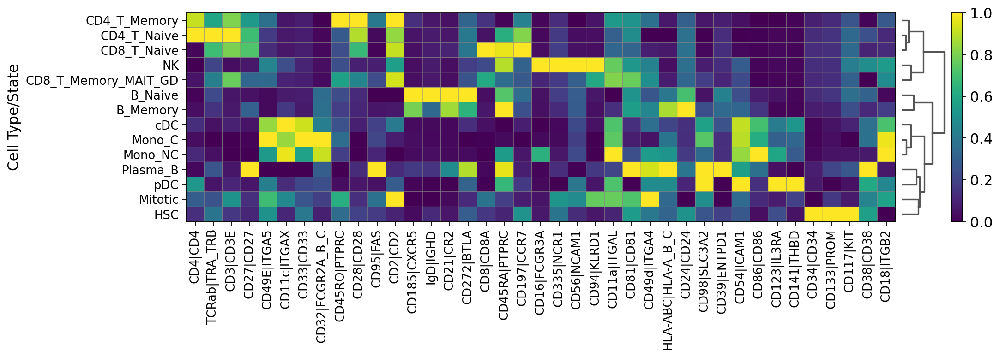

In [103]:
figdir = fig_prefix + 'misc/'
sc.settings.figdir = figdir
sc.pl.matrixplot(concat_ctrl, var_names=features_to_plot, 
                 groupby='Cell Type/State', dendrogram=True, standard_scale='var', save='.ctrl.cts.diffex.proteins.png');

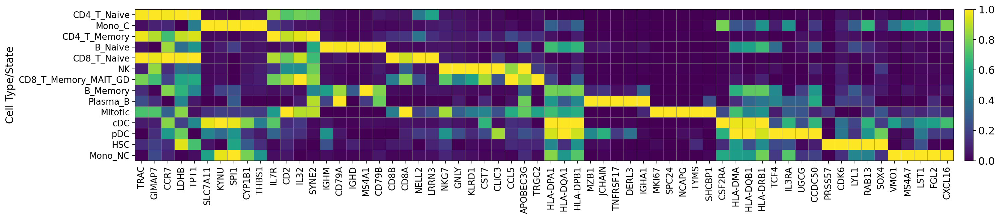

In [194]:
figdir = fig_prefix + 'misc/'
sc.settings.figdir = figdir
sc.pl.matrixplot(concat_ctrl, var_names=transcripts_to_plot, 
                 groupby='Cell Type/State', dendrogram=False, standard_scale='var', save='.ctrl.cts.diffex.genes.png');

In [197]:
concat_ctrl_high_count.obs['Cell Type/State'] = concat_ctrl_high_count.obs['ct2']
concat_ctrl_high_count.uns['Cell Type/State_colors'] = ct2_colors

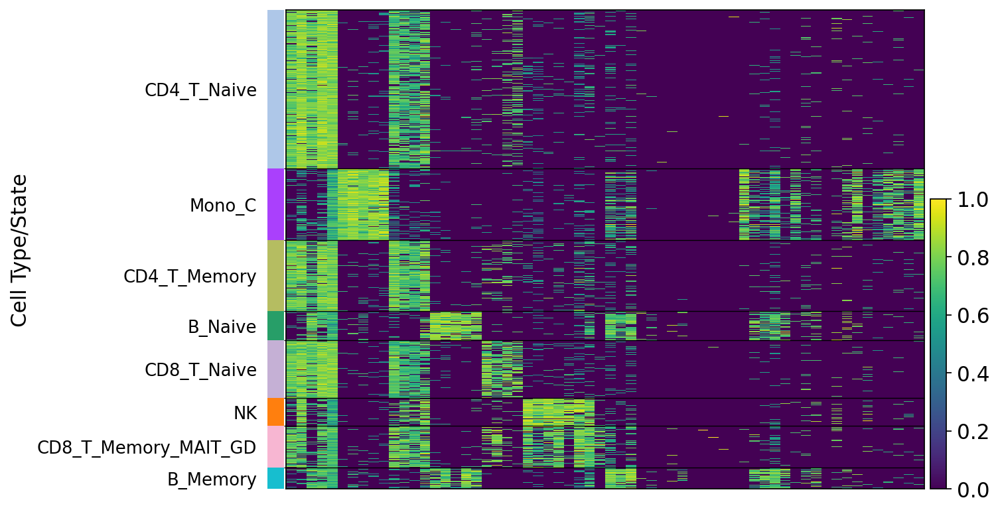

In [200]:
figdir = fig_prefix + 'misc/'
sc.settings.figdir = figdir
sc.pl.heatmap(concat_ctrl_high_count, var_names=transcripts_to_plot, 
                 groupby='Cell Type/State', dendrogram=False, standard_scale='var',
              save='.ctrl.highcount.cts.diffex.genes.png');

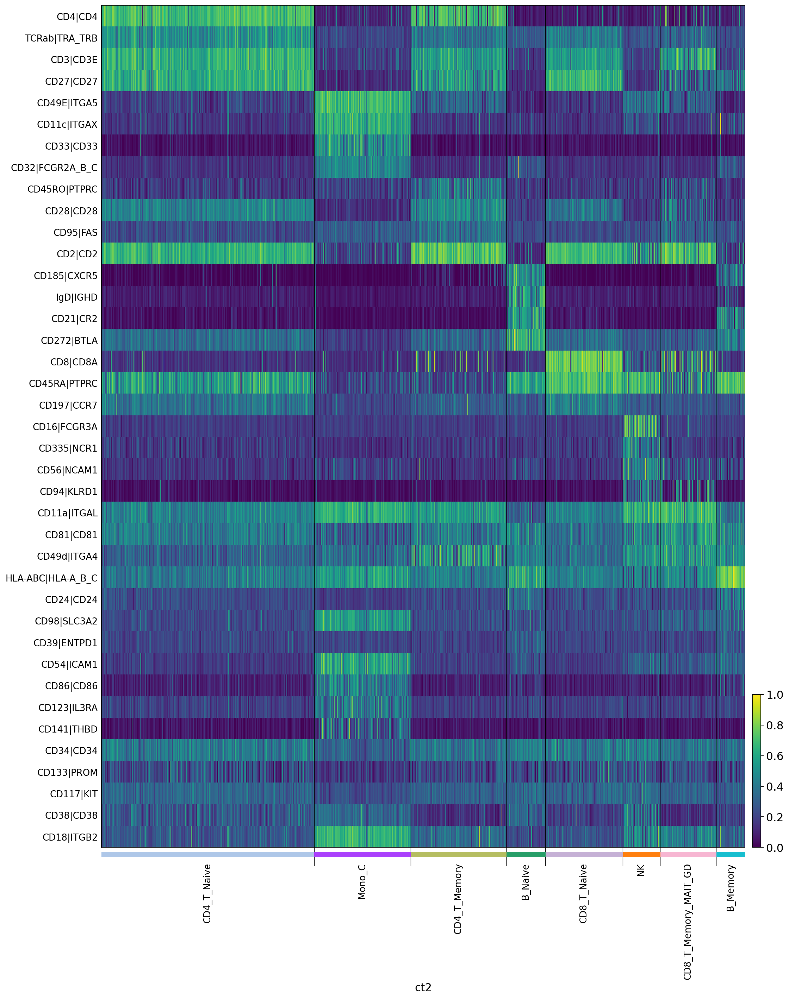

In [203]:
figdir = fig_prefix + 'misc/'
sc.settings.figdir = figdir
sc.pl.heatmap(concat_ctrl_high_count, var_names=features_to_plot, 
              groupby='ct2', standard_scale='var', 
              use_raw=True, swap_axes=True, figsize=(15, 20), save='.ctrl.highcount.cts.diffex.proteins.png');

In [215]:
filename = fig_prefix + 'misc/stacked.bar.cellnumber.condition.ct.png'
labels = clusts
props = dict()

plt.figure(figsize=(10,5))
for cond in conds:
    props[cond] = cond_ct_df.loc[cond].values
lastpos = [0]*len(clusts)
for cond in props:
    plt.bar(labels, props[cond], label=cond, bottom=lastpos)
    lastpos = props[cond] + lastpos

plt.ylabel('Number')
plt.xlabel('Cell Type/State')
plt.title('Number of Cells per Condition per Cell Type/State')
ax = plt.gca()
ax.set_xticklabels(labels, rotation=45, horizontalalignment='right')
ax.legend();
plt.savefig(filename, dpi=80)
plt.close()

In [216]:
filename = fig_prefix + 'misc/stacked.bar.cellproportion.condition.ct.png'
labels = clusts
props = dict()

plt.figure(figsize=(10,5))
for cond in conds:
    props[cond] = cond_ct_df_div.loc[cond].values
lastpos = [0]*len(clusts)
for cond in props:
    plt.bar(labels, props[cond], label=cond, bottom=lastpos)
    lastpos = props[cond] + lastpos

plt.ylabel('Proportion')
plt.xlabel('Cell Type/State')
plt.title('Proportion of Cells from each Condition per Cell Type/State')
ax = plt.gca()
ax.set_xticklabels(labels, rotation=45, horizontalalignment='right')
ax.legend();
plt.savefig(filename, dpi=80)
plt.close()

In [228]:
filename = fig_prefix + 'misc/boxplot.ct.proportion.per.ind.png'
fig, ax = plt.subplots(1, 1, figsize=(20,4))
sns.boxplot(data=ind_ct.divide(ind_ct.sum(1),0), ax=ax, palette=color_dict)
ax.set_xticklabels(ax.get_xticklabels(), rotation=30, horizontalalignment='right');
ax.set_ylabel('Proportion')
ax.set_xlabel('Cell Type/State');
ax.set_title('Proportion of Each Cell Type Per Individual', fontsize=17);
plt.savefig(filename, dpi=80)
plt.close()

# EXTRA:

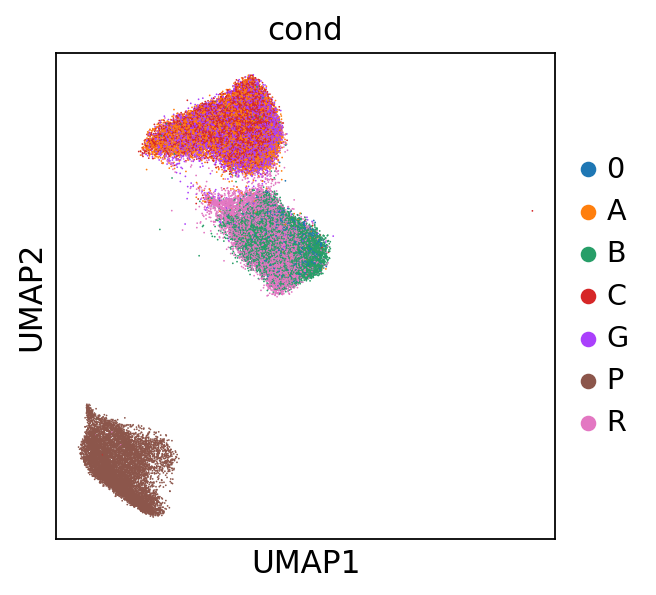

In [7]:
sc.pl.umap(concat_cd4_naive,color='cond');

In [22]:
cond_to_test = 'A'

In [23]:
concat_cd4_naive.obs['cond_to_test'] = (concat_cd4_naive.obs['cond'] == cond_to_test).values.astype(int)

In [59]:
test_tt = de.test.t_test(data=concat_cd4_naive, grouping="cond_to_test")
fc = test_tt.log10_fold_change()
mq = -test_tt.log10_qval_clean()

In [60]:
plt.hist(fc,bins=100);

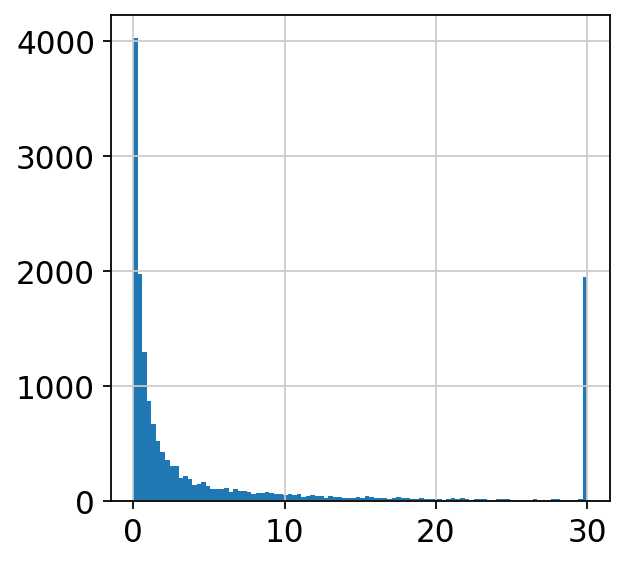

In [61]:
plt.hist(mq,bins=100);

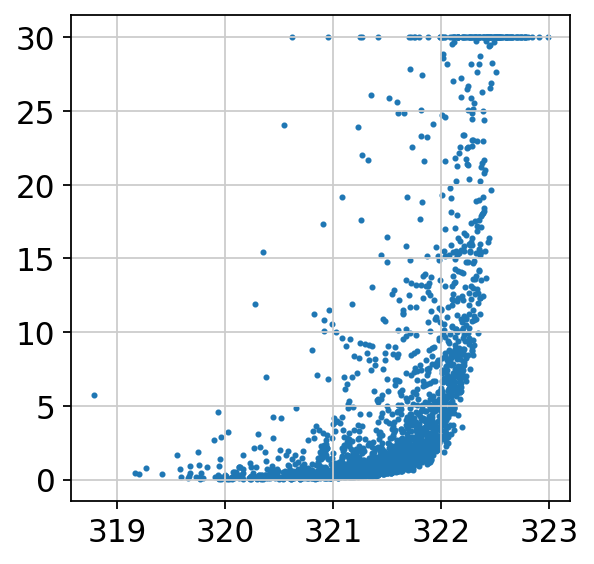

In [56]:
plt.scatter(x=fc[fc > 200], y=mq[fc > 200],s=3);

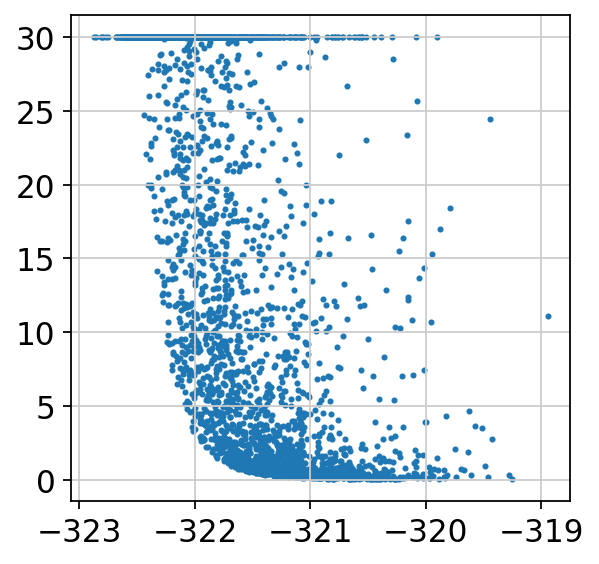

In [62]:
plt.scatter(x=fc[fc < -200], y=mq[fc < -200],s=3);

In [ ]:
fc_thresh = 322
mq_thresh = 25
concat_cd4_naive.var_names[(fc > fc_thresh) & (mq > mq_thresh)].tolist()

In [71]:
fc_thresh = -321
mq_thresh = 25
concat_cd4_naive.var_names[(fc < fc_thresh) & (mq > mq_thresh)].tolist()

['NOC2L',
 'TNFRSF4',
 'B3GALT6',
 'MRPL20',
 'ATAD3B',
 'ATAD3A',
 'ACOT7',
 'DNAJC11',
 'ENO1',
 'SLC25A33',
 'DFFA',
 'SRM',
 'SDHB',
 'EMC1',
 'MRTO4',
 'ECE1',
 'PITHD1',
 'SRSF10',
 'ZNF593',
 'NUDC',
 'IFI6',
 'SESN2',
 'EIF3I',
 'YARS',
 'AK2',
 'SFPQ',
 'MRPS15',
 'GNL2',
 'C1orf109',
 'YRDC',
 'SF3A3',
 'UTP11',
 'AKIRIN1',
 'PABPC4',
 'MFSD2A',
 'ZMPSTE24',
 'CTPS1',
 'HIVEP3',
 'YBX1',
 'EBNA1BP2',
 'DPH2',
 'SLC6A9',
 'EIF2B3',
 'HPDL',
 'NASP',
 'BTF3L4',
 'MAGOH',
 'MRPL37',
 'CYP2J2',
 'MIER1',
 'IL12RB2',
 'SERBP1',
 'GADD45A',
 'TYW3',
 'RABGGTB',
 'NEXN',
 'FUBP1',
 'IFI44L',
 'IFI44',
 'RPF1',
 'C1orf52',
 'ZNHIT6',
 'SELENOF',
 'GBP1',
 'GBP2',
 'GBP4',
 'GBP5',
 'LRRC8B',
 'LRRC8C',
 'SARS',
 'PSMA5',
 'CSF1',
 'WDR77',
 'SLC16A1',
 'BCAS2',
 'SIKE1',
 'ATP1A1',
 'TTF2',
 'WDR3',
 'WARS2',
 'PHGDH',
 'RBM8A',
 'OTUD7B',
 'CIART',
 'CHTOP',
 'ILF2',
 'KCNN3',
 'SCAMP3',
 'MSTO1',
 'PMF1',
 'CCT3',
 'GPATCH4',
 'IFI16',
 'SLAMF1',
 'CD48',
 'PFDN2',
 'ATP1B1',
 'F5'

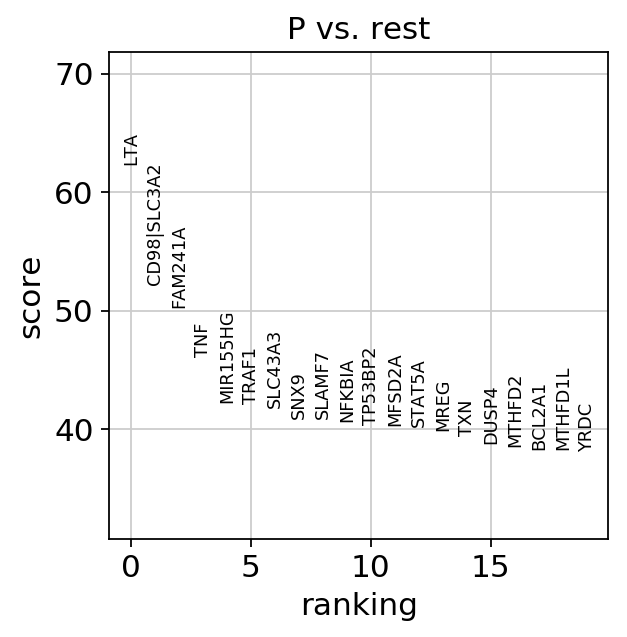

In [101]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(mem_b, groupby='cond', groups=['P'], reference='rest', n_genes=50)
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(mem_b, ncols=5, n_genes=20)
sc.settings.verbosity = 4

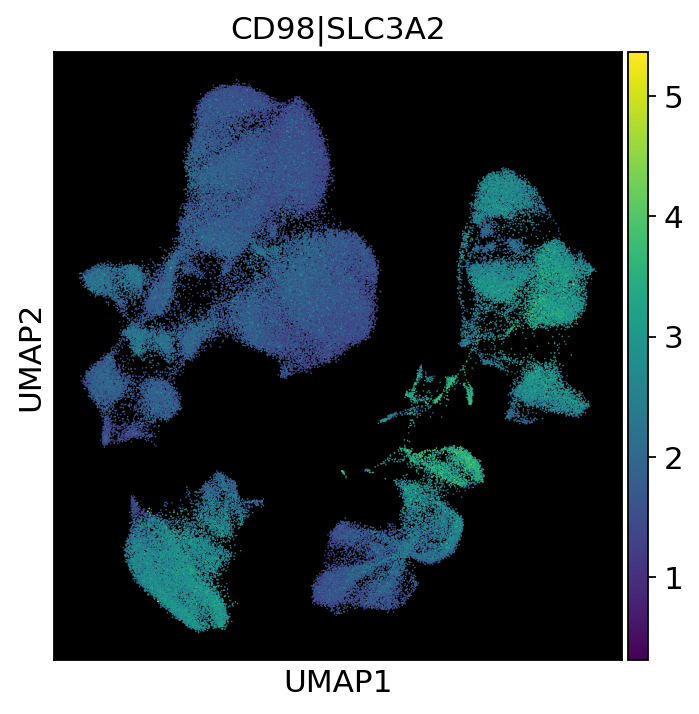

In [102]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))
for color, ax in zip(['CD98|SLC3A2'], [ax]):
    ax.set_facecolor('black')
    sc.pl.umap(concat, color=color, ax=ax, show=False, return_fig=False, size=2)

In [80]:
cov = 'leiden'

In [81]:
g1 = ['20']
g2 = [i for i in concat[concat.obs['ct2'].isin(['B_Naive','B_Memory'])].obs[cov].dtype.categories if i not in g1]

In [82]:
def grouped_rank(adata, groups, return_genes=True, size=5, n_genes=20, figsize=(5,5), cov='leiden'):

    assert len(groups) == 2
    for i in range(2):
        groups[i] = np.array(groups[i]).astype(str)
        
    grouped_clusts = [i for j in groups for i in j]
    numclusts = np.unique(adata.obs[cov].values)
    groups.append(np.setdiff1d(numclusts, grouped_clusts).astype('<U21'))
    fig, axes = plt.subplots(1, 2, figsize=(9, 4))
    for clusts, title, ax in zip(groups, ['0','1'], axes):
        adata.obs['val'] = adata.obs[cov].isin(clusts).values
        ax.set_facecolor('black')
        sc.pl.umap(adata,color='val', ax=ax, size=size, show=False, return_fig=False, title=title)
    adata.obs.drop(columns='val', inplace=True)

    adata.obs['rank_compare'] = adata.obs[cov].copy()
    groups_dict = dict(zip(range(3), groups))
    for group in groups_dict:
        for clust in groups_dict[group]:
            adata.obs['rank_compare'].replace(clust, 'ct%s' % group, regex=True, inplace=True)
    adata.obs['rank_compare'] = adata.obs['rank_compare'].str.replace('ct','').astype('category')
    
    fig, ax = plt.subplots(1, 1, figsize=figsize)
    sc.settings.verbosity = 0
    for ax in np.ravel(ax):
        rank_adata = adata.copy()
        sc.tl.rank_genes_groups(rank_adata, groupby='rank_compare', n_genes=n_genes, groups=['0'], reference='1', use_raw=True)
        y = range(n_genes)[::-1]
        x = [i[0] for i in rank_adata.uns['rank_genes_groups']['scores'].tolist()][:n_genes]
        genes = [i[0] for i in rank_adata.uns['rank_genes_groups']['names'].tolist()]
        txts = genes[:n_genes]
        ax.scatter(x, y, s=0)
        for i, txt in enumerate(txts):
            ax.annotate(txt, (x[i], y[i]), rotation=0, size=10)
        ax.set_yticklabels([])
        ax.set_title('0 vs 1')
    sc.settings.verbosity = 4
    adata.obs.drop(columns='rank_compare', inplace=True)
    if return_genes == True:
        return genes
    else:
        return 

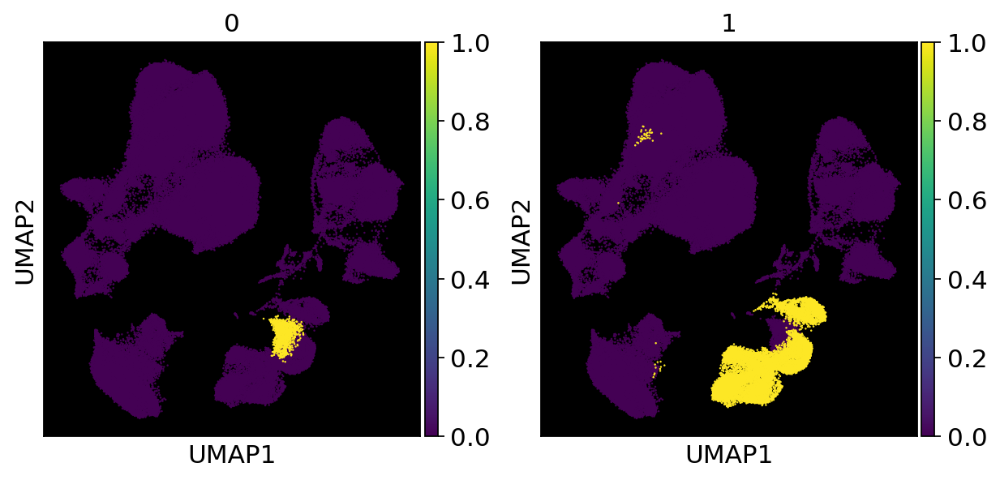

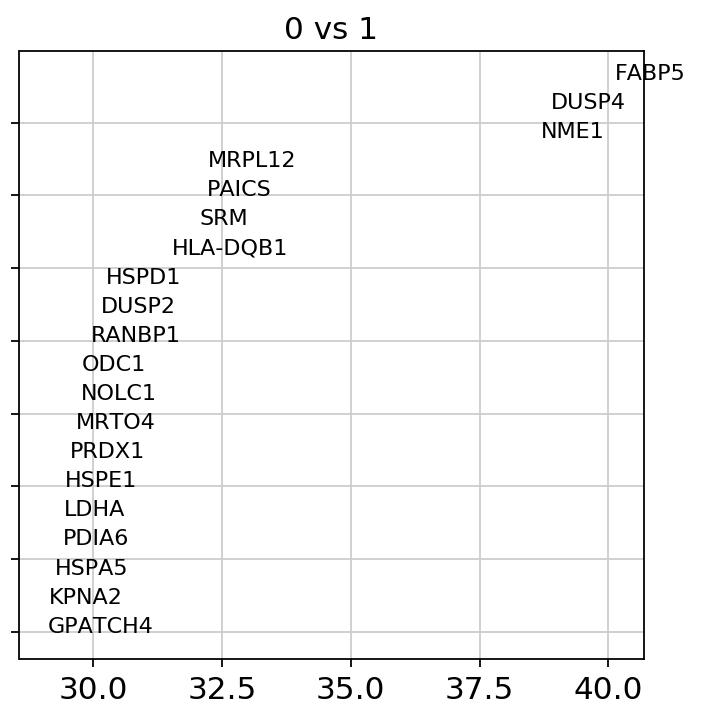

In [83]:
genes = grouped_rank(concat, groups=[g1, g2], size=5, n_genes=20, figsize=(5,5), cov=cov)

In [84]:
df = low_de_make(concat, p=0.2, p_of=g1[0], cov=cov)

In [85]:
de_genes = low_de_compare(df, g1[0], compare=g2)

In [86]:
s = de_genes[:30]

print(s)
# for i in s.index:
#     print(i)

COCH         9.210938
NR4A1        6.226562
LINC01480    6.183594
TEX9         5.429688
ITGB2        5.324219
MYO1E        5.253906
NAB2         5.117188
NR4A2        5.011719
BTN2A2       4.980469
FCRL5        4.761719
TVP23A       4.683594
TNFRSF9      4.667969
SH2D2A       4.156250
SLC15A3      4.132812
TMC8         3.949219
PRAG1        3.779297
AGMAT        3.761719
NEK6         3.757812
CHST11       3.720703
PTPN6        3.656250
GRASP        3.654297
BICDL1       3.634766
HLA-DOA      3.580078
CD72         3.507812
SLC17A9      3.476562
LRMP         3.390625
CARD11       3.341797
GM2A         3.333984
HAGHL        3.324219
TLE1         3.312500
dtype: float16


In [111]:
[i for i in all_features if 'NR4A2' in i]

['NR4A2']

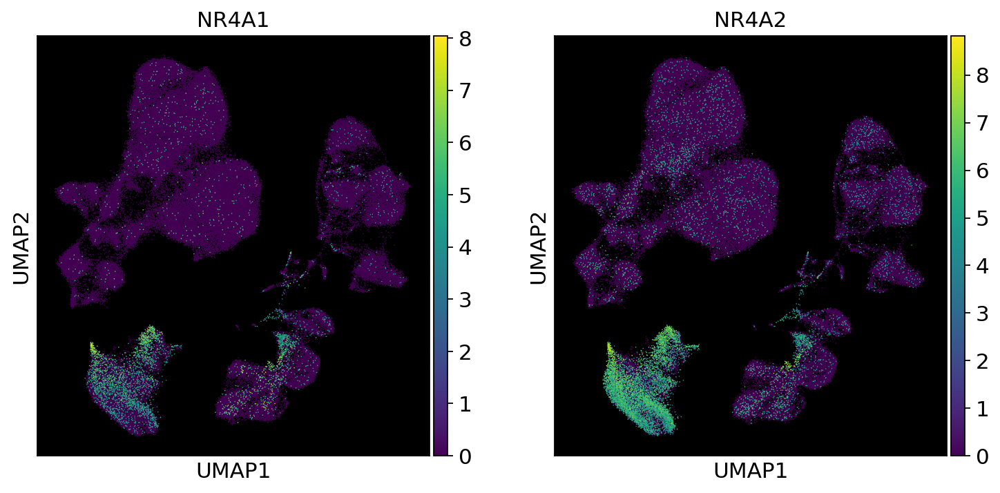

In [116]:
fig, ax = plt.subplots(1, 2, figsize=(11,5))
for color, ax in zip(['NR4A1', 'NR4A2'], ax):
    ax.set_facecolor('black')
    sc.pl.umap(concat, color=color, ax=ax, show=False, return_fig=False, size=2)

Trying to set attribute `.uns` of view, copying.


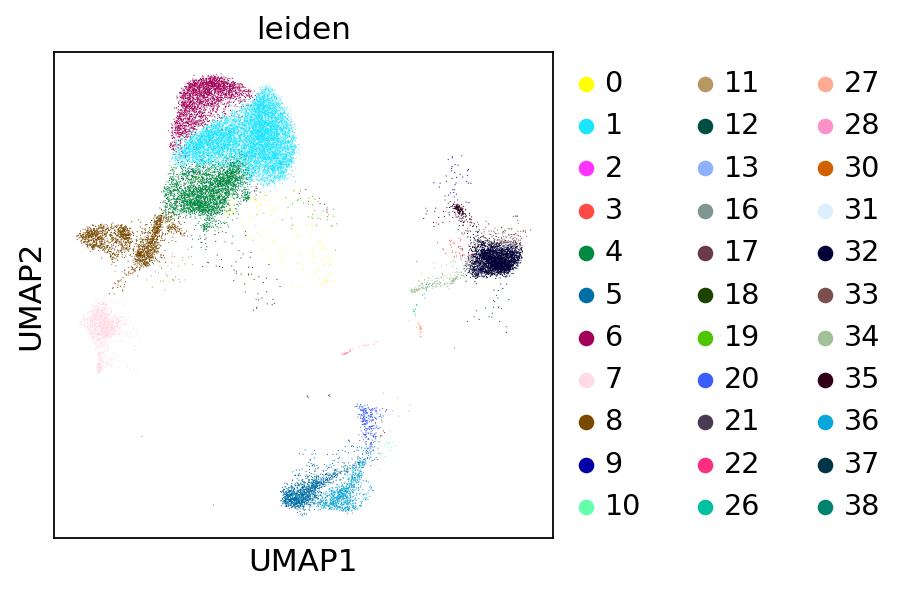

In [110]:
sc.pl.umap(concat[concat.obs['cond'] == 'A'], color='leiden', size=1);

In [131]:
mem_b_p = mem_b[mem_b.obs['cond'] == 'P'].copy()

running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


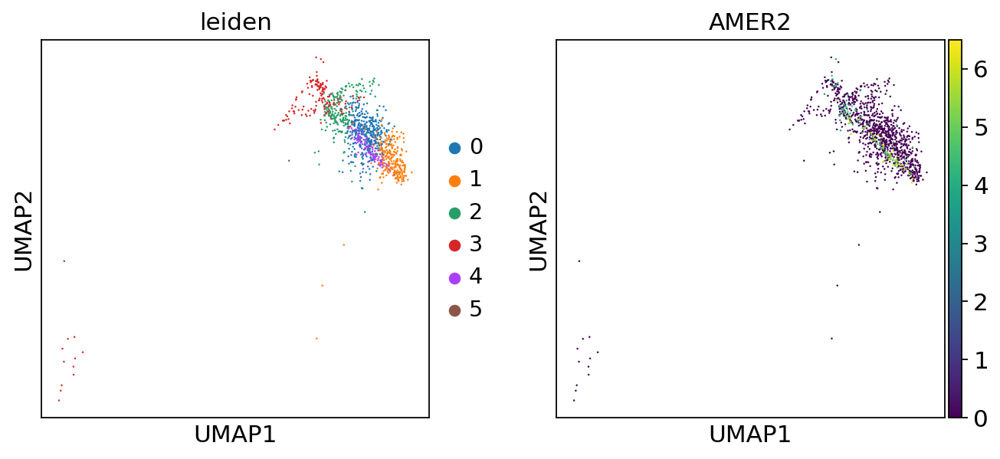

In [172]:
sc.tl.leiden(mem_b_p, resolution=0.5)
sc.pl.umap(mem_b_p, color=['leiden', 'AMER2'], size=5);

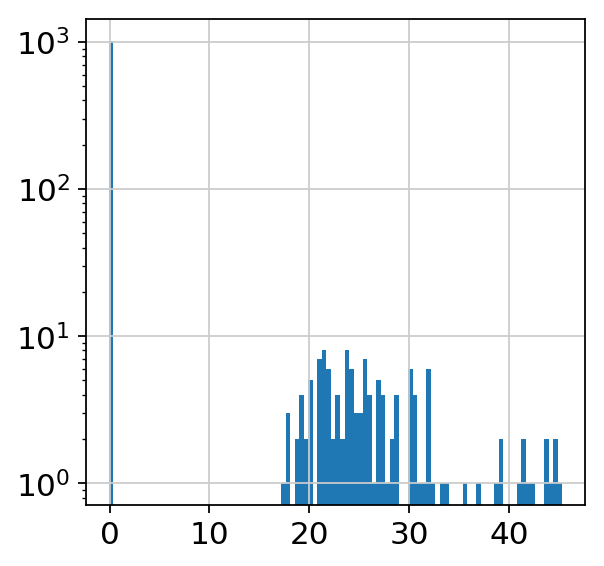

In [134]:
plt.hist(mem_b_p.obs_vector('AMER2'),bins=100);
plt.yscale('log')

In [144]:
mem_b_p.obs['AMER2+'] = mem_b_p.obs_vector('AMER2') > 10
mem_b_p.obs['AMER2+'] = mem_b_p.obs['AMER2+'].astype('category')

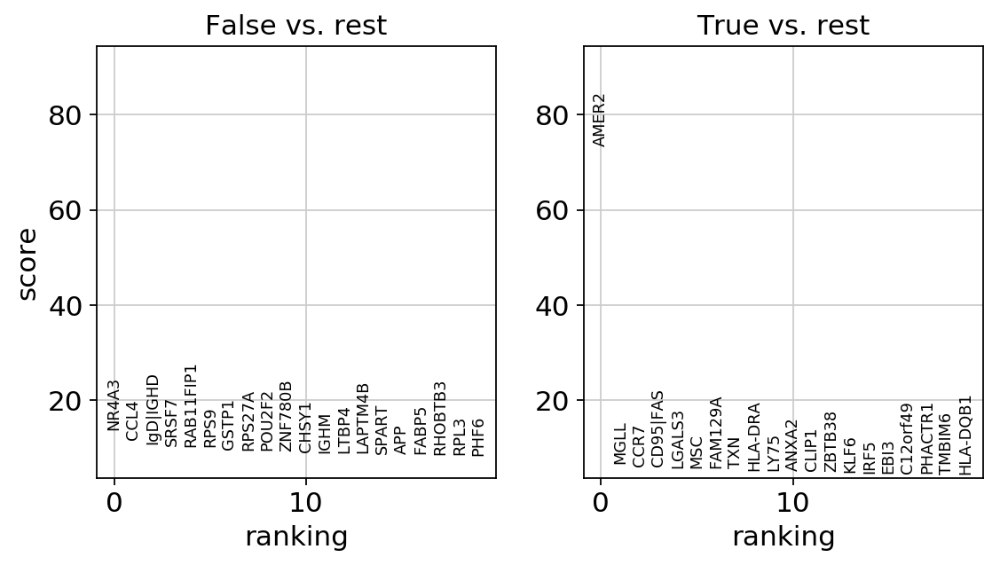

In [145]:
sc.settings.verbosity = 0 
warnings.filterwarnings('ignore')
sc.tl.rank_genes_groups(mem_b_p, groupby='AMER2+', n_genes=50)
warnings.filterwarnings('default')
sc.pl.rank_genes_groups(mem_b_p, ncols=5, n_genes=20)
sc.settings.verbosity = 4

In [175]:
cov = 'AMER2+'

In [176]:
g1 = [True]
g2 = [i for i in mem_b_p.obs[cov].dtype.categories if i not in g1]

In [187]:
df = low_de_make(mem_b_p, p=0.2, p_of=g1[0], cov=cov)

In [188]:
de_genes = low_de_compare(df, g1[0], compare=g2)

In [192]:
s = de_genes[:20]

# print(s)
for i in s.index:
    print(i)

AMER2
CDCA7
MSC
CPEB2
MIR193BHG
CDKN2C
IRF5
SLC2A6
SPIRE1
USP32
CAPG
OAS3
PAG1
LY75
SLC27A2
SMCO4
SLC41A2
SOCS2
MAP3K20
PDE4D


In [ ]:
fig, ax = plt.subplots(4,4,figsize=(20,20))
for val, ax in tqdm(zip(concat.obs['ct2'].dtype.categories, np.ravel(ax))):
    concat.obs['val'] = concat.obs['ct2'] == val
    ax.set_facecolor('black')
    sc.pl.umap(concat,color='val', ax=ax, show=False, return_fig=False, title=val)
    concat.obs.drop(columns='val', inplace=True)
plt.tight_layout()

In [177]:
[i for i in concat.raw.var_names if 'CD38' in i]

In [194]:
pd.DataFrame(concat_ctrl.uns['rank_genes_groups']['names'].tolist()).loc[:,9].tolist()

['MKI67',
 'SPC24',
 'NCAPG',
 'TYMS',
 'SHCBP1',
 'ESCO2',
 'KIFC1',
 'CDK1',
 'HIST1H1B',
 'BIRC5',
 'ZWINT',
 'CENPW',
 'KIF11',
 'CENPM',
 'CDCA2',
 'TOP2A',
 'CHEK1',
 'NUSAP1',
 'CCNF',
 'BRCA1',
 'NDC80',
 'CENPF',
 'TPX2',
 'ASPM',
 'HMGB3',
 'DHFR',
 'MAD2L1',
 'KIF2C',
 'CCNA2',
 'ATAD2',
 'NCAPD2',
 'H2AFX',
 'CKS1B',
 'PRIM2',
 'BARD1',
 'PHGDH',
 'SGO2',
 'RRM1',
 'EZH2',
 'CKS2',
 'NCAPD3',
 'SAE1',
 'TIAM1',
 'KIF22',
 'FAM111A',
 'TOPBP1',
 'SMC4',
 'CKAP2',
 'SMC2',
 'KPNA2']

In [195]:
features = ['MKI67', 'SPC24', 'NCAPG', 'TYMS', 'SHCBP1', 'ESCO2',
            'KIFC1', 'CDK1', 'HIST1H1B', 'BIRC5', 'ZWINT', 'CENPW',
            'KIF11', 'CENPM', 'CDCA2', 'TOP2A', 'CHEK1', 'NUSAP1'
           ]

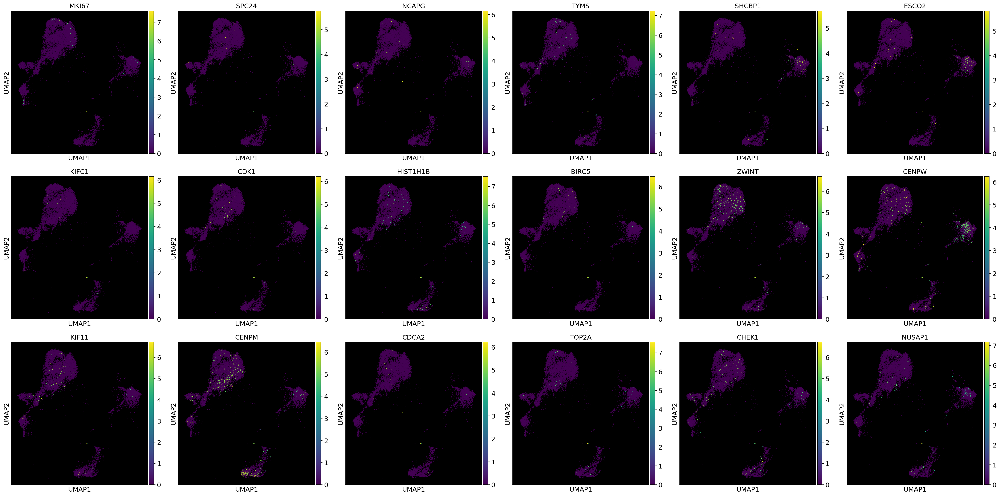

In [197]:
fig, ax = plt.subplots(3, 6, figsize=(30, 15))
for ax, f in tqdm(zip(np.ravel(ax), features)):
    ax.set_facecolor('black')
    sc.pl.umap(concat_ctrl, color=f, ax=ax,show=False, return_fig=False, size=5, use_raw=True)
plt.tight_layout()

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(9.5,10))
for color, ax in zip(['ct2'], [ax]):
    sc.pl.umap(concat_ctrl, color=color, ax=ax, show=False, return_fig=False, size=5)

## Explore DESeq2 Genes

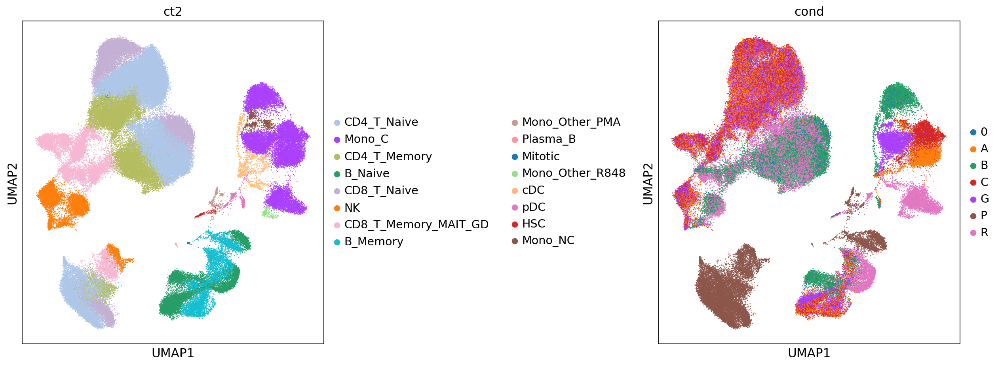

In [12]:
fig, ax = plt.subplots(1, 2, figsize=(16,6))
for color, ax in zip(['ct2', 'cond'], ax):
    sc.pl.umap(concat, color=color, ax=ax, show=False, return_fig=False, size=5)
plt.tight_layout()

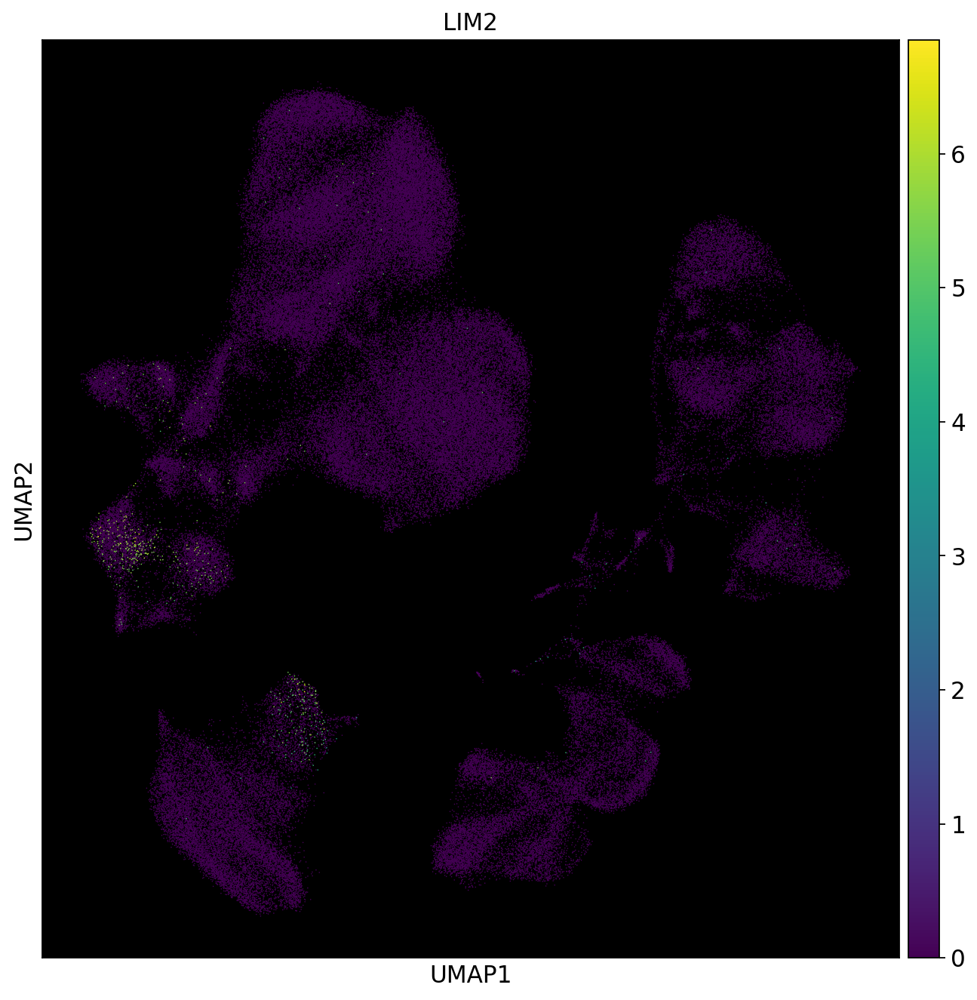

In [44]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
ax.set_facecolor('black')
sc.pl.umap(concat, color='LIM2', ax=ax, show=False, return_fig=False, size=2);

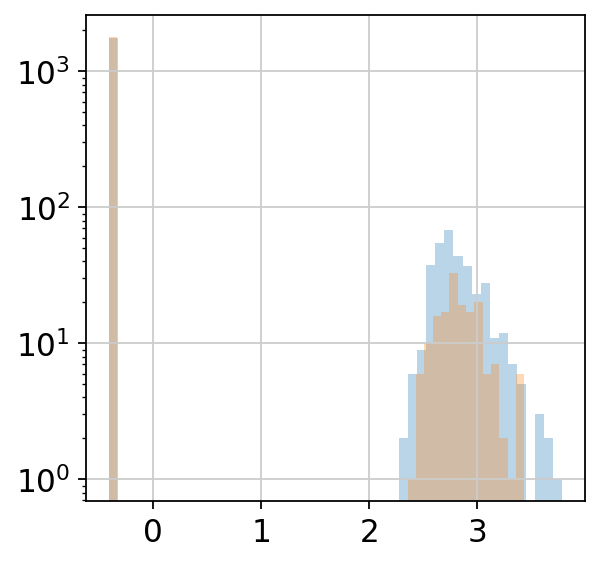

In [41]:
plt.hist(concat[(concat.obs['cond'] == 'B') & (concat.obs['ct2'] == 'CD8_T_Memory_MAIT_GD')].obs_vector('CD226').tolist(), bins=50, alpha=0.3);
plt.hist(concat[(concat.obs['cond'] == 'C') & (concat.obs['ct2'] == 'CD8_T_Memory_MAIT_GD')].obs_vector('CD226').tolist(), bins=50, alpha=0.3);
plt.yscale('log');

In [7]:
def low_de_make(adata, p=0.2, p_of='any', cov='leiden'):
    '''
    adata = adata object with a raw attribute
    p = percentage of cells that should be expressing a gene for it to be reported
    p_of = when subsetting genes to report, at least p percent of cells in ANY cluster ('any') \n
    should be expressing the gene, or only in the provided cluster
    '''
    X = adata.raw.X.copy()
    clusts = adata.obs[cov].dtype.categories
    df = pd.DataFrame(0,index=clusts, columns=adata.raw.var_names.values,dtype=np.float16)
    for clust in clusts:
        clustbool = (adata.obs[cov] == clust).values
        clustX = X[clustbool]
        clustX = clustX.tocsc()
        df.loc[clust] = clustX.getnnz(axis=0)/clustX.shape[0]
    if p_of == 'any':
        df = df.iloc[:,df.apply(lambda x: np.any(x > p), axis=0, raw=True).values]
    else:
        df = df.iloc[:,(df.loc[p_of] > p).values]
    return df

def low_de_compare(df, clust, compare=None):
    if type(compare) == type(None): 
        return (df.loc[clust]/df[~(df.index == clust)].mean()).sort_values(ascending=False)
    elif type(compare) == list:
        return (df.loc[clust]/df[(df.index.isin(compare))].mean()).sort_values(ascending=False)

In [8]:
concat.obs['ct2-cond'] = concat.obs['ct2'].astype(str) + '-' + concat.obs['cond'].astype(str)
sc.pl.umap(concat, color='ct2-cond', show=False, return_fig=False); # to set is as a category
plt.close()

... storing 'ct2-cond' as categorical


In [13]:
concat.obs['ct2'].dtype.categories

Index(['CD4_T_Naive', 'Mono_C', 'CD4_T_Memory', 'B_Naive', 'CD8_T_Naive', 'NK',
       'CD8_T_Memory_MAIT_GD', 'B_Memory', 'Mono_Other_PMA', 'Plasma_B',
       'Mitotic', 'Mono_Other_R848', 'cDC', 'pDC', 'HSC', 'Mono_NC'],
      dtype='object')

In [14]:
cts = ['CD4_T_Naive', 'CD4_T_Memory', 'B_Naive', 
       'CD8_T_Naive', 'NK', 'CD8_T_Memory_MAIT_GD', 'B_Memory', 
       'pDC', 'HSC']
conds = ['A', 'B', 'G', 'P', 'R']

In [15]:
low_de_genes_5p = dict()
for ct in tqdm(cts):
    low_de_genes_5p[ct] = dict()
    for cond in conds:
        g1 = [ct + '-' + cond]
        g2 = [ct + '-' + 'C']
        df = low_de_make(concat, p=0.05, p_of=g1[0], cov='ct2-cond')
        low_de_genes_5p[ct][cond] = low_de_compare(df, g1[0], compare=g2)

In [24]:
cts = ['Mono_C']
conds = ['A', 'B', 'G', 'R']

In [25]:
for ct in tqdm(cts):
    low_de_genes_5p[ct] = dict()
    for cond in conds:
        g1 = [ct + '-' + cond]
        g2 = [ct + '-' + 'C']
        df = low_de_make(concat, p=0.05, p_of=g1[0], cov='ct2-cond')
        low_de_genes_5p[ct][cond] = low_de_compare(df, g1[0], compare=g2)

In [26]:
cts = ['Mono_NC']
conds = ['A', 'B', 'G']

In [27]:
for ct in tqdm(cts):
    low_de_genes_5p[ct] = dict()
    for cond in conds:
        g1 = [ct + '-' + cond]
        g2 = [ct + '-' + 'C']
        df = low_de_make(concat, p=0.05, p_of=g1[0], cov='ct2-cond')
        low_de_genes_5p[ct][cond] = low_de_compare(df, g1[0], compare=g2)

In [28]:
ct = 'Mono_Other_R848'
low_de_genes_5p[ct] = dict()
g1 = [ct + '-R']
g2 = ['Mono_NC-C']
df = low_de_make(concat, p=0.05, p_of=g1[0], cov='ct2-cond')
low_de_genes_5p[ct][cond] = low_de_compare(df, g1[0], compare=g2)

In [32]:
ct = 'Mono_Other_PMA'
low_de_genes_5p[ct] = dict()
g1 = [ct + '-P']
g2 = ['Mono_NC-C', 'Mono_C-C', 'Mono_cDC-C']
df = low_de_make(concat, p=0.05, p_of=g1[0], cov='ct2-cond')
low_de_genes_5p[ct][cond] = low_de_compare(df, g1[0], compare=g2)

In [39]:
for ct in low_de_genes_5p:
    for cond in low_de_genes_5p[ct]:
        print((ct, cond))
        print(low_de_genes_5p[ct][cond][:5])
        print('')

('CD4_T_Naive', 'A')
RELB        2.068359
C17orf49    1.968750
NFKB2       1.939453
ADGRE1      1.903320
IER5        1.848633
dtype: float16

('CD4_T_Naive', 'B')
LAMP3      26.65625
MDK        26.06250
BCL2L14    23.71875
ZBP1       21.50000
FAR2       15.40625
dtype: float16

('CD4_T_Naive', 'G')
ETV7     5.140625
GBP5     3.921875
FBXO6    2.816406
APOL1    2.806641
GBP1     2.802734
dtype: float16

('CD4_T_Naive', 'P')
KIF1A      622.0000
IL21       131.5000
IGHV1-3    119.4375
FOSL1       87.2500
MFSD2A      64.6250
dtype: float16

('CD4_T_Naive', 'R')
BCL2L14    43.750000
LAMP3      33.218750
ETV7       20.125000
MDK        16.859375
ZBP1       15.234375
dtype: float16

('CD4_T_Memory', 'A')
MIR3142HG    1.653320
HELZ2        1.603516
RELB         1.596680
OAS3         1.493164
NFE2L3       1.458984
dtype: float16

('CD4_T_Memory', 'B')
MDK        42.687500
LAMP3      24.796875
BCL2L14    20.859375
ZBP1       17.125000
TGM1       12.281250
dtype: float16

('CD4_T_Memory', 'G')
GB

In [64]:
gene = 'LAMP3'
cond = 'B'
ct = 'CD4_T_Naive'

In [65]:
cond_vals = np.array(concat[(concat.obs['cond'] == cond) & (concat.obs['ct2'] == ct)].obs_vector(gene))
ctrl_vals = np.array(concat[(concat.obs['cond'] == 'C') & (concat.obs['ct2'] == ct)].obs_vector(gene))

In [66]:
df = pd.DataFrame(zip([cond]*len(cond_vals) + ['C']*len(ctrl_vals), 
                      np.concatenate([cond_vals, ctrl_vals]),
                     ), columns = ['CONDITION', 'EXPRESSION'])

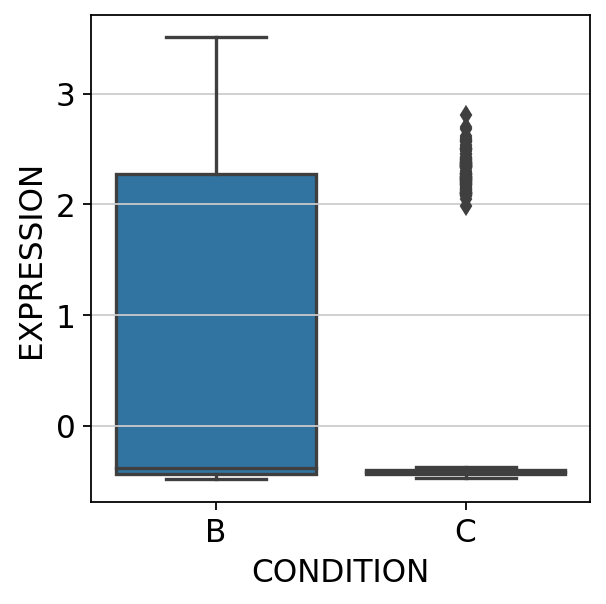

In [67]:
sns.boxplot(data=df, y='EXPRESSION', x='CONDITION');

In [52]:
np.concatenate([cond_vals, ctrl_vals]).shape

(2499,)